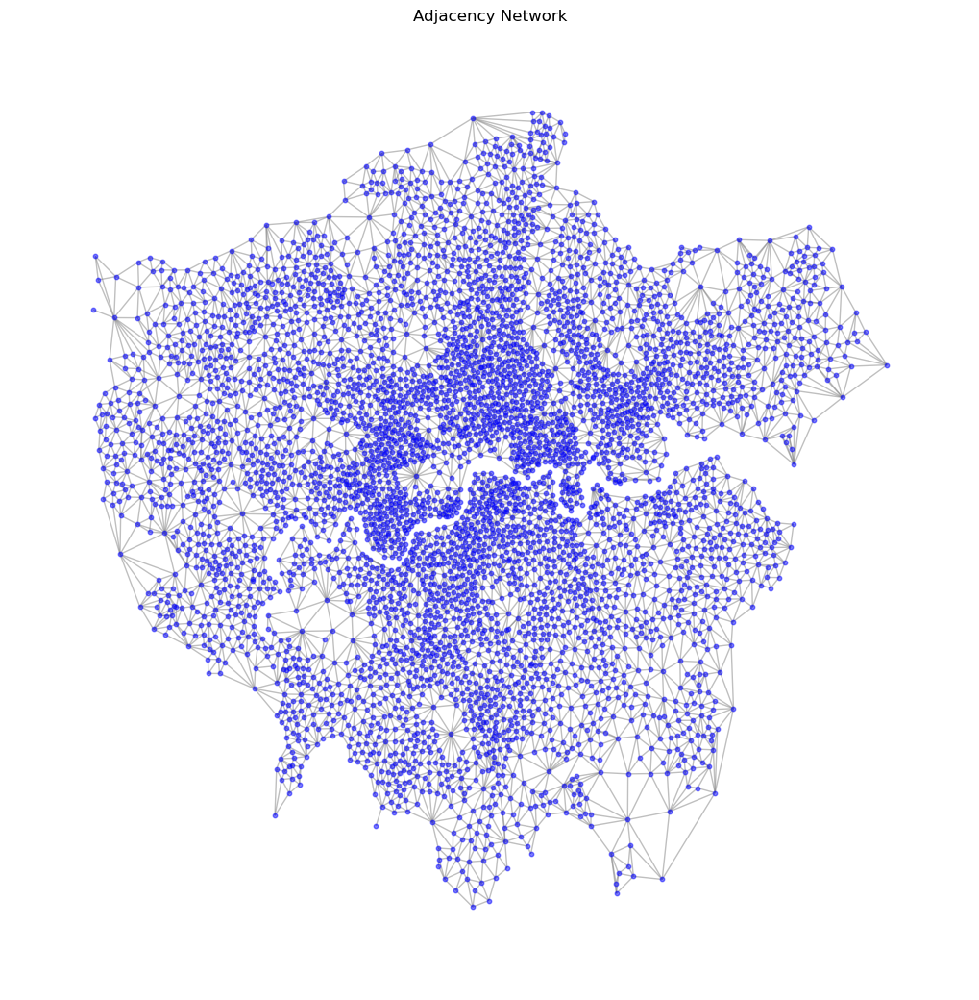

In [162]:
import pandas as pd
import geopandas as gpd
from shapely import wkt
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from scipy.spatial import distance_matrix
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn.functional as F
from torch_geometric.nn import GINConv, global_add_pool
from torch_geometric.utils import from_networkx
from statsmodels.stats.outliers_influence import variance_inflation_factor
import random
import itertools
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# 读取CSV文件并创建GeoDataFrame
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# 创建几何对象（假设geometry列包含WKT格式的多边形数据）
gdf = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkt(df['geometry']))

# 设置坐标系 (假设是WGS84坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 计算每个LSOA的几何中心点
gdf['geo_centroid'] = gdf.centroid
# 转换为投影坐标系（例如，英国国家格网EPSG:27700）
# gdf = gdf.to_crs(epsg=27700)
# 计算相邻关系
neighbors = gpd.sjoin(gdf, gdf, how='left', predicate='intersects')

# 手动处理索引
neighbors = neighbors[neighbors.index != neighbors.index_right]

# 构建邻接矩阵
G = nx.Graph()

# 添加节点
for idx, row in gdf.iterrows():
    G.add_node(idx, pos=(row.geo_centroid.x, row.geo_centroid.y))

# 添加边，根据相邻关系
for idx, row in neighbors.iterrows():
    G.add_edge(row.name, row['index_right'], weight=1)

# 可视化邻接关系
pos = nx.get_node_attributes(G, 'pos')
plt.figure(figsize=(10, 10))
nx.draw(G, pos, node_size=10, node_color='blue', edge_color='grey', alpha=0.5)
plt.title("Adjacency Network")
plt.show()

In [163]:
# 读取CSV文件并创建GeoDataFrame
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# 创建几何对象（假设geometry列包含WKT格式的多边形数据）
gdf = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkt(df['geometry']))

# 设置坐标系 (假设是WGS84坐标系)
gdf.set_crs(epsg=4326, inplace=True)

# 固定选取的变量
fixed_columns = [
    'c_percent Aged 10 to 14 years', 'c_percent Aged 15 to 19 years',
       'c_percent Aged 20 to 24 years', 'c_percent Aged 25 to 29 years',
       'c_percent Aged 30 to 34 years', 'c_percent Aged 35 to 39 years',
       'c_percent Aged 40 to 44 years', 'c_percent Aged 65 to 69 years',
       'c_percent Aged 70 to 74 years', 'c_percent Aged 75 to 79 years',
       'c_percent Aged 80 to 84 years', 'c_percent Aged 85 years and over',
       'c_percent mixed', 'c_percent white',
       'c_percent 2. Professional occupations', 'c_pop_density', 'e_NO2',
       'e_ndvi', 'e_water', 'e_trees', 'e_grass', 'e_bare', 'c_percent asian',
       'c_percent black', 'c_percent buddhist', 'c_percent muslim',
       'c_percent no central heating', 'c_percent communal heating',
       'c_percent TFW less than 2km', 'c_percent 49 or more hours worked',
       'c_percent commute on foot', 'c_percent commute metro rail',
       'c_percent commute bus', 'c_percent commute bicycle',
       'c_percent student moved to address',
       'c_percent occupancy rating bedrooms -2',
       'c_percent occupancy rating bedrooms -1', 'c_percent 10 years or more',
       'c_percent 2 years or more but less than 5 years',
       'c_percent 5 years or more but less than 10 years',
       # 'c_percent married or in a registered civil partnership married same sex',
       'c_percent married or in a registered civil partnership in a registered civil partnership',
       'c_percent separated but still legally married or still legally in a civil partnership separated but still in a registered civil partnership',
       'c_percent divorced or civil partnership dissolved formerly in a civil partnership now legally dissolved',
       'c_percent   cannot speak english well',
       'c_percent   cannot speak english',
       'c_percent households deprived in four dimensions',
       'c_percent christian', 'c_percent WFH', 'c_percent part-time',
       'c_percent commute train', 'c_percent outside UK moved to address',
       'c_percent occupancy rating bedrooms +2',
       'c_percent 3. Associate professional and technical occupations',
       'c_percent 5. Skilled trades occupations',
       'c_percent 6. Caring leisure and other service occupations',
       'c_percent divorced or civil partnership dissolved',
       'e_lake_mix_layer_depth', 'e_snow_cover', 'e_surface_runoff_sum',
       'e_snow_and_ice', 'e_crops', 'e_evaporation_from_the_top_of_canopy_sum',
       'e_shrub_and_scrub'
]

# 提取固定变量
fixed_features = gdf[fixed_columns].apply(pd.to_numeric, errors='coerce')

# 使用邻接节点的均值填充空值
for i, row in fixed_features.iterrows():
    for col in fixed_columns:
        if pd.isna(row[col]):
            neighbor_indices = list(G.neighbors(i))
            if neighbor_indices:  # 确保有邻居
                neighbor_values = fixed_features.iloc[neighbor_indices][col]
                mean_value = neighbor_values.mean()
                if pd.isna(mean_value):
                    mean_value = fixed_features[col].mean()  # 如果邻居的均值还是nan，使用全局均值填充
                fixed_features.at[i, col] = mean_value
            else:
                fixed_features.at[i, col] = fixed_features[col].mean()  # 如果没有邻居，使用全局均值填充

# 再次检查是否有任何nan值
print("Remaining NaN count:", fixed_features.isna().sum().sum())

# 计算VIF
def calculate_vif(df):
    vif = pd.DataFrame()
    vif["Variable"] = df.columns
    vif["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return vif

vif_df = calculate_vif(fixed_features)
# 设置显示选项，防止输出省略
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
print(vif_df)

# 进行标准化
scaler = StandardScaler()
final_features_scaled = scaler.fit_transform(fixed_features)
final_features_tensor = torch.tensor(final_features_scaled, dtype=torch.float)

# 准备目标变量
target_column = 'o_depression_quantity_per_capita'
target = gdf[target_column].apply(pd.to_numeric, errors='coerce').fillna(0)
targets = torch.tensor(target.values, dtype=torch.float).unsqueeze(1)  # 添加维度以匹配模型输出

# 将 NetworkX 图转换为 PyTorch Geometric 数据
from torch_geometric.utils import from_networkx
data = from_networkx(G)
data.x = final_features_tensor
data.y = targets

Remaining NaN count: 0
                                             Variable          VIF
0                       c_percent Aged 10 to 14 years    55.868596
1                       c_percent Aged 15 to 19 years    22.219294
2                       c_percent Aged 20 to 24 years    39.900070
3                       c_percent Aged 25 to 29 years    42.327632
4                       c_percent Aged 30 to 34 years    65.695808
5                       c_percent Aged 35 to 39 years    76.727955
6                       c_percent Aged 40 to 44 years    77.304368
7                       c_percent Aged 65 to 69 years    37.196747
8                       c_percent Aged 70 to 74 years    35.156901
9                       c_percent Aged 75 to 79 years    27.160777
10                      c_percent Aged 80 to 84 years    20.075569
11                   c_percent Aged 85 years and over    10.407913
12                                    c_percent mixed    30.521846
13                                    c

In [3]:
import torch
from torch_geometric.utils import k_hop_subgraph
from sklearn.model_selection import KFold
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import itertools
import random

# 定义GATv2模型
class GATv2(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.bn1 = torch.nn.BatchNorm1d(hidden1)  # Batch normalization
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.bn2 = torch.nn.BatchNorm1d(hidden2)  # Batch normalization
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = self.bn1(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.conv2(x, edge_index)
        x = self.bn2(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.fc1(x)
        return x

def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    out = model(data.x, data.edge_index)
    loss = F.mse_loss(out, data.y)
    loss.backward()
    optimizer.step()
    return loss.item()

def evaluate(model, data):
    model.eval()
    with torch.no_grad():
        out = model(data.x, data.edge_index)
        loss = F.mse_loss(out, data.y).item()
    return loss

# 定义早停机制
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0.0):
        self.patience = patience
        self.min_delta = min_delta
        self.best_loss = float('inf')
        self.counter = 0

    def step(self, loss):
        if loss < self.best_loss - self.min_delta:
            self.best_loss = loss
            self.counter = 0
        else:
            self.counter += 1

        return self.counter >= self.patience

# 定义划分子图的函数
def create_subgraph(data, train_idx, test_idx, num_hops):
    train_idx = torch.tensor(train_idx, dtype=torch.long, device=data.edge_index.device)
    test_idx = torch.tensor(test_idx, dtype=torch.long, device=data.edge_index.device)
    
    # 获取训练集子图，包含 train_idx 节点以及 num_hops 范围内的邻居
    train_subgraph = k_hop_subgraph(train_idx, num_hops, data.edge_index, relabel_nodes=True)
    train_edge_index, train_x, train_y = train_subgraph[1], data.x[train_subgraph[0]], data.y[train_subgraph[0]]
    
    # 获取测试集子图，包含 test_idx 节点以及 num_hops 范围内的邻居
    test_subgraph = k_hop_subgraph(test_idx, num_hops, data.edge_index, relabel_nodes=True)
    test_edge_index, test_x, test_y = test_subgraph[1], data.x[test_subgraph[0]], data.y[test_subgraph[0]]
    
    return (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y)

# 超参数搜索函数
def hyperparameter_search(data, param_space, k=5, num_hops=1, num_samples=20):
    best_loss = float('inf')
    best_params = None
    random_params = [dict(zip(param_space, v)) for v in random.sample(list(itertools.product(*param_space.values())), num_samples)]
    
    for param_idx, params in enumerate(random_params):
        print(f'Starting hyperparameter set {param_idx + 1}/{num_samples}: {params}')
        kf = KFold(n_splits=k, shuffle=True, random_state=42)
        fold_losses = []
        
        for fold, (train_idx, test_idx) in enumerate(kf.split(np.arange(data.num_nodes))):
            print(f'Starting fold {fold + 1}/{k} for hyperparameter set {param_idx + 1}/{num_samples}')
            (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y) = create_subgraph(data, train_idx, test_idx, num_hops)
            
            # 重新初始化模型和优化器
            model = GATv2(
                in_channels=train_x.shape[1], 
                hidden1=params['hidden1'], 
                hidden2=params['hidden2'], 
                out_channels=train_y.shape[1], 
                dropout=params['dropout']
            )
            optimizer = torch.optim.Adam(model.parameters(), lr=params['lr'], weight_decay=params['weight_decay'])
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)
            early_stopping = EarlyStopping(patience=10)
            
            # 训练模型
            for epoch in range(params['num_epochs']):
                loss = train(model, optimizer, data)
                val_loss = evaluate(model, data)
                scheduler.step(val_loss)
                
                if (epoch + 1) % 10 == 0:
                    print(f'Hyperparameter set {param_idx + 1}/{num_samples}, Fold {fold + 1}/{k}, Epoch {epoch + 1}/{params["num_epochs"]}, Loss: {loss:.4f}, Val Loss: {val_loss:.4f}')
                
                if early_stopping.step(val_loss):
                    print(f'Early stopping at epoch {epoch + 1}')
                    break
            
            # 测试模型
            model.eval()
            with torch.no_grad():
                pred = model(test_x, test_edge_index)
                fold_loss = F.mse_loss(pred, test_y).item()
                fold_losses.append(fold_loss)
        
        avg_fold_loss = np.mean(fold_losses)
        print(f'Average loss for hyperparameter set {param_idx + 1}/{num_samples}: {avg_fold_loss:.4f}')
        if avg_fold_loss < best_loss:
            best_loss = avg_fold_loss
            best_params = params
    
    return best_params, best_loss

# 定义K-Fold交叉验证
def k_fold_cross_validation(data, best_params, k=5, num_hops=1):
    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    results = []

    all_indices = np.arange(data.num_nodes)
    
    for fold, (train_idx, test_idx) in enumerate(kf.split(all_indices)):
        print(f'Starting fold {fold + 1}/{k}')
        (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y) = create_subgraph(data, train_idx, test_idx, num_hops)
        
        # 重新初始化模型和优化器
        model = GATv2(
            in_channels=train_x.shape[1], 
            hidden1=best_params['hidden1'], 
            hidden2=best_params['hidden2'], 
            out_channels=train_y.shape[1], 
            dropout=best_params['dropout']
        )
        optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)
        early_stopping = EarlyStopping(patience=10)
        
        # 训练模型
        model.train()
        for epoch in range(best_params['num_epochs']):
            loss = train(model, optimizer, data)
            val_loss = evaluate(model, data)
            scheduler.step(val_loss)
            
            if (epoch + 1) % 10 == 0:
                print(f'Fold {fold + 1}/{k}, Epoch {epoch + 1}/{best_params["num_epochs"]}, Loss: {loss:.4f}, Val Loss: {val_loss:.4f}')
            
            if early_stopping.step(val_loss):
                print(f'Early stopping at epoch {epoch + 1}')
                break
        
        # 测试模型
        model.eval()
        with torch.no_grad():
            pred = model(test_x, test_edge_index)
            y_true = test_y.numpy()
            y_pred = pred.numpy()
            
            mse = mean_squared_error(y_true, y_pred)
            rmse = np.sqrt(mse)
            mae = mean_absolute_error(y_true, y_pred)
            r2 = r2_score(y_true, y_pred)
        
        print(f'Fold {fold + 1} results - MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}, R²: {r2:.4f}')
        results.append((mse, rmse, mae, r2))
    
    return results

# 假设你已经有一个数据对象 data
# data = ...

# 定义超参数空间
param_space = {
    'lr': [0.001, 0.005, 0.01],
    'weight_decay': [5e-4, 1e-3, 5e-3],
    'hidden1': [32, 64, 128],
    'hidden2': [16, 32, 64],
    'dropout': [0.3, 0.5, 0.7],
    'num_epochs': [100]
}

# 使用K-Fold交叉验证进行超参数搜索
best_params, best_loss = hyperparameter_search(data, param_space)
print(f'Best params: {best_params}, Best loss: {best_loss:.4f}')

# 使用最佳超参数进行K-Fold交叉验证
results = k_fold_cross_validation(data, best_params)

# 打印K-Fold结果
for fold, (mse, rmse, mae, r2) in enumerate(results):
    print(f'Fold {fold + 1} - MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}, R²: {r2:.4f}')

# 计算平均结果
avg_results = np.mean(results, axis=0)
print(f'Average - MSE: {avg_results[0]:.4f}, RMSE: {avg_results[1]:.4f}, MAE: {avg_results[2]:.4f}, R²: {avg_results[3]:.4f}')


Starting hyperparameter set 1/20: {'lr': 0.005, 'weight_decay': 0.0005, 'hidden1': 128, 'hidden2': 64, 'dropout': 0.7, 'num_epochs': 100}
Starting fold 1/5 for hyperparameter set 1/20


C:\Users\0\anaconda3\envs\envGEOG0051\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Hyperparameter set 1/20, Fold 1/5, Epoch 10/100, Loss: 253.9201, Val Loss: 218.9035
Hyperparameter set 1/20, Fold 1/5, Epoch 20/100, Loss: 198.6679, Val Loss: 156.6373
Hyperparameter set 1/20, Fold 1/5, Epoch 30/100, Loss: 147.4015, Val Loss: 111.7117
Hyperparameter set 1/20, Fold 1/5, Epoch 40/100, Loss: 102.0048, Val Loss: 78.7302
Hyperparameter set 1/20, Fold 1/5, Epoch 50/100, Loss: 72.6361, Val Loss: 55.1228
Hyperparameter set 1/20, Fold 1/5, Epoch 60/100, Loss: 54.0854, Val Loss: 42.7212
Hyperparameter set 1/20, Fold 1/5, Epoch 70/100, Loss: 46.6591, Val Loss: 34.4060
Hyperparameter set 1/20, Fold 1/5, Epoch 80/100, Loss: 45.7238, Val Loss: 30.2840
Hyperparameter set 1/20, Fold 1/5, Epoch 90/100, Loss: 40.1182, Val Loss: 28.6614
Hyperparameter set 1/20, Fold 1/5, Epoch 100/100, Loss: 40.4499, Val Loss: 24.6997
Starting fold 2/5 for hyperparameter set 1/20
Hyperparameter set 1/20, Fold 2/5, Epoch 10/100, Loss: 239.2878, Val Loss: 213.9744
Hyperparameter set 1/20, Fold 2/5, Epoch 2

C:\Users\0\anaconda3\envs\envGEOG0051\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Fold 2/5, Epoch 10/100, Loss: 240.8233, Val Loss: 191.1257
Fold 2/5, Epoch 20/100, Loss: 184.4096, Val Loss: 141.6463
Fold 2/5, Epoch 30/100, Loss: 132.8233, Val Loss: 103.1301
Fold 2/5, Epoch 40/100, Loss: 89.8958, Val Loss: 72.7643
Fold 2/5, Epoch 50/100, Loss: 58.2752, Val Loss: 49.2694
Fold 2/5, Epoch 60/100, Loss: 39.3950, Val Loss: 36.6106
Fold 2/5, Epoch 70/100, Loss: 29.7295, Val Loss: 28.4952
Fold 2/5, Epoch 80/100, Loss: 26.7439, Val Loss: 24.2357
Fold 2/5, Epoch 90/100, Loss: 24.1649, Val Loss: 22.6637
Fold 2/5, Epoch 100/100, Loss: 23.5126, Val Loss: 19.5257
Fold 2 results - MSE: 21.2366, RMSE: 4.6083, MAE: 3.5083, R²: 0.7451
Starting fold 3/5


C:\Users\0\anaconda3\envs\envGEOG0051\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Fold 3/5, Epoch 10/100, Loss: 243.1879, Val Loss: 195.7122
Fold 3/5, Epoch 20/100, Loss: 187.2944, Val Loss: 148.4805
Fold 3/5, Epoch 30/100, Loss: 136.9349, Val Loss: 109.5120
Fold 3/5, Epoch 40/100, Loss: 93.6858, Val Loss: 76.9326
Fold 3/5, Epoch 50/100, Loss: 60.7175, Val Loss: 53.2703
Fold 3/5, Epoch 60/100, Loss: 40.5913, Val Loss: 38.6243
Fold 3/5, Epoch 70/100, Loss: 30.4762, Val Loss: 29.5612
Fold 3/5, Epoch 80/100, Loss: 26.7474, Val Loss: 24.5386
Fold 3/5, Epoch 90/100, Loss: 24.2204, Val Loss: 21.7069
Fold 3/5, Epoch 100/100, Loss: 22.2271, Val Loss: 20.1127
Fold 3 results - MSE: 21.3088, RMSE: 4.6161, MAE: 3.6586, R²: 0.7481
Starting fold 4/5


C:\Users\0\anaconda3\envs\envGEOG0051\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Fold 4/5, Epoch 10/100, Loss: 246.9543, Val Loss: 208.8353
Fold 4/5, Epoch 20/100, Loss: 193.0171, Val Loss: 146.0207
Fold 4/5, Epoch 30/100, Loss: 142.0402, Val Loss: 108.1148
Fold 4/5, Epoch 40/100, Loss: 96.5994, Val Loss: 78.7610
Fold 4/5, Epoch 50/100, Loss: 61.6373, Val Loss: 53.2776
Fold 4/5, Epoch 60/100, Loss: 40.7757, Val Loss: 38.0875
Fold 4/5, Epoch 70/100, Loss: 31.0993, Val Loss: 29.0640
Fold 4/5, Epoch 80/100, Loss: 26.6404, Val Loss: 23.9420
Fold 4/5, Epoch 90/100, Loss: 24.1690, Val Loss: 20.7194
Fold 4/5, Epoch 100/100, Loss: 21.9933, Val Loss: 19.0076
Fold 4 results - MSE: 21.1962, RMSE: 4.6039, MAE: 3.5652, R²: 0.7435
Starting fold 5/5


C:\Users\0\anaconda3\envs\envGEOG0051\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Fold 5/5, Epoch 10/100, Loss: 245.2753, Val Loss: 214.2219
Fold 5/5, Epoch 20/100, Loss: 191.0749, Val Loss: 151.8246
Fold 5/5, Epoch 30/100, Loss: 140.4187, Val Loss: 110.4001
Fold 5/5, Epoch 40/100, Loss: 95.2425, Val Loss: 79.1423
Fold 5/5, Epoch 50/100, Loss: 61.0100, Val Loss: 54.1552
Fold 5/5, Epoch 60/100, Loss: 40.1594, Val Loss: 37.8674
Fold 5/5, Epoch 70/100, Loss: 30.2266, Val Loss: 29.6245
Fold 5/5, Epoch 80/100, Loss: 27.3286, Val Loss: 24.4567
Fold 5/5, Epoch 90/100, Loss: 24.8860, Val Loss: 23.0773
Fold 5/5, Epoch 100/100, Loss: 22.9331, Val Loss: 21.2015
Fold 5 results - MSE: 23.2088, RMSE: 4.8175, MAE: 3.7829, R²: 0.7183
Fold 1 - MSE: 21.3606, RMSE: 4.6218, MAE: 3.6130, R²: 0.7396
Fold 2 - MSE: 21.2366, RMSE: 4.6083, MAE: 3.5083, R²: 0.7451
Fold 3 - MSE: 21.3088, RMSE: 4.6161, MAE: 3.6586, R²: 0.7481
Fold 4 - MSE: 21.1962, RMSE: 4.6039, MAE: 3.5652, R²: 0.7435
Fold 5 - MSE: 23.2088, RMSE: 4.8175, MAE: 3.7829, R²: 0.7183
Average - MSE: 21.6622, RMSE: 4.6535, MAE: 3.6256

In [164]:
best_params = {'lr': 0.005,
 'weight_decay': 0.001,
 'hidden1': 128,
 'hidden2': 64,
 'dropout': 0.3,
 'num_epochs': 200}

In [6]:
# 使用最佳超参数进行K-Fold交叉验证
results = k_fold_cross_validation(data, best_params)

# 打印K-Fold结果
for fold, (mse, rmse, mae, r2) in enumerate(results):
    print(f'Fold {fold + 1} - MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}, R²: {r2:.4f}')

# 计算平均结果
avg_results = np.mean(results, axis=0)
print(f'Average - MSE: {avg_results[0]:.4f}, RMSE: {avg_results[1]:.4f}, MAE: {avg_results[2]:.4f}, R²: {avg_results[3]:.4f}')

Starting fold 1/5


C:\Users\0\anaconda3\envs\envGEOG0051\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Fold 1/5, Epoch 10/200, Loss: 240.7827, Val Loss: 203.4027
Fold 1/5, Epoch 20/200, Loss: 184.6616, Val Loss: 144.6203
Fold 1/5, Epoch 30/200, Loss: 133.6417, Val Loss: 105.4210
Fold 1/5, Epoch 40/200, Loss: 89.7657, Val Loss: 74.8547
Fold 1/5, Epoch 50/200, Loss: 57.1300, Val Loss: 49.4482
Fold 1/5, Epoch 60/200, Loss: 38.7251, Val Loss: 36.6913
Fold 1/5, Epoch 70/200, Loss: 29.6229, Val Loss: 28.6111
Fold 1/5, Epoch 80/200, Loss: 26.1700, Val Loss: 23.9558
Fold 1/5, Epoch 90/200, Loss: 23.4681, Val Loss: 21.3564
Fold 1/5, Epoch 100/200, Loss: 21.6524, Val Loss: 20.3401
Fold 1/5, Epoch 110/200, Loss: 19.9911, Val Loss: 17.7168
Fold 1/5, Epoch 120/200, Loss: 18.5956, Val Loss: 15.5551
Fold 1/5, Epoch 130/200, Loss: 18.0128, Val Loss: 14.5653
Fold 1/5, Epoch 140/200, Loss: 17.0081, Val Loss: 14.2010
Fold 1/5, Epoch 150/200, Loss: 16.4117, Val Loss: 12.2588
Fold 1/5, Epoch 160/200, Loss: 15.0783, Val Loss: 10.6967
Fold 1/5, Epoch 170/200, Loss: 14.7518, Val Loss: 9.8163
Fold 1/5, Epoch 18

C:\Users\0\anaconda3\envs\envGEOG0051\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Fold 2/5, Epoch 10/200, Loss: 242.7335, Val Loss: 200.6277
Fold 2/5, Epoch 20/200, Loss: 184.7310, Val Loss: 141.6441
Fold 2/5, Epoch 30/200, Loss: 130.7561, Val Loss: 100.5187
Fold 2/5, Epoch 40/200, Loss: 87.0595, Val Loss: 74.7271
Fold 2/5, Epoch 50/200, Loss: 57.1014, Val Loss: 50.1254
Fold 2/5, Epoch 60/200, Loss: 39.9676, Val Loss: 37.4677
Fold 2/5, Epoch 70/200, Loss: 30.0468, Val Loss: 28.4582
Fold 2/5, Epoch 80/200, Loss: 26.4879, Val Loss: 23.3919
Fold 2/5, Epoch 90/200, Loss: 24.1490, Val Loss: 20.7784
Fold 2/5, Epoch 100/200, Loss: 22.0127, Val Loss: 18.4683
Fold 2/5, Epoch 110/200, Loss: 19.9703, Val Loss: 16.5295
Fold 2/5, Epoch 120/200, Loss: 19.2415, Val Loss: 14.9429
Fold 2/5, Epoch 130/200, Loss: 17.7785, Val Loss: 14.1389
Fold 2/5, Epoch 140/200, Loss: 17.0906, Val Loss: 12.8959
Fold 2/5, Epoch 150/200, Loss: 16.7340, Val Loss: 12.5388
Fold 2/5, Epoch 160/200, Loss: 15.5210, Val Loss: 11.6697
Fold 2/5, Epoch 170/200, Loss: 14.8772, Val Loss: 10.8712
Fold 2/5, Epoch 1

C:\Users\0\anaconda3\envs\envGEOG0051\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Fold 3/5, Epoch 10/200, Loss: 235.3603, Val Loss: 182.1959
Fold 3/5, Epoch 20/200, Loss: 177.7116, Val Loss: 126.3202
Fold 3/5, Epoch 30/200, Loss: 125.0822, Val Loss: 92.5843
Fold 3/5, Epoch 40/200, Loss: 83.2682, Val Loss: 65.0525
Fold 3/5, Epoch 50/200, Loss: 54.2660, Val Loss: 46.5685
Fold 3/5, Epoch 60/200, Loss: 37.9577, Val Loss: 35.3879
Fold 3/5, Epoch 70/200, Loss: 29.6613, Val Loss: 26.9944
Fold 3/5, Epoch 80/200, Loss: 26.1548, Val Loss: 22.8765
Fold 3/5, Epoch 90/200, Loss: 23.5722, Val Loss: 21.3241
Fold 3/5, Epoch 100/200, Loss: 22.2863, Val Loss: 19.4156
Fold 3/5, Epoch 110/200, Loss: 20.5585, Val Loss: 17.9984
Fold 3/5, Epoch 120/200, Loss: 19.0265, Val Loss: 17.2892
Fold 3/5, Epoch 130/200, Loss: 18.3939, Val Loss: 14.7878
Fold 3/5, Epoch 140/200, Loss: 18.2528, Val Loss: 13.8355
Fold 3/5, Epoch 150/200, Loss: 17.8069, Val Loss: 13.4890
Fold 3/5, Epoch 160/200, Loss: 17.3303, Val Loss: 13.2963
Fold 3/5, Epoch 170/200, Loss: 17.3315, Val Loss: 13.0416
Fold 3/5, Epoch 18

C:\Users\0\anaconda3\envs\envGEOG0051\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Fold 4/5, Epoch 10/200, Loss: 249.8599, Val Loss: 207.9908
Fold 4/5, Epoch 20/200, Loss: 194.7249, Val Loss: 149.6473
Fold 4/5, Epoch 30/200, Loss: 142.9068, Val Loss: 111.0206
Fold 4/5, Epoch 40/200, Loss: 96.2503, Val Loss: 78.2942
Fold 4/5, Epoch 50/200, Loss: 60.9939, Val Loss: 55.0815
Fold 4/5, Epoch 60/200, Loss: 39.7112, Val Loss: 36.4840
Fold 4/5, Epoch 70/200, Loss: 30.7864, Val Loss: 29.0233
Fold 4/5, Epoch 80/200, Loss: 26.6544, Val Loss: 24.2706
Fold 4/5, Epoch 90/200, Loss: 24.8098, Val Loss: 21.8527
Fold 4/5, Epoch 100/200, Loss: 22.0454, Val Loss: 21.1231
Fold 4/5, Epoch 110/200, Loss: 20.7047, Val Loss: 19.4121
Fold 4/5, Epoch 120/200, Loss: 18.9197, Val Loss: 18.0535
Fold 4/5, Epoch 130/200, Loss: 18.4451, Val Loss: 14.7141
Fold 4/5, Epoch 140/200, Loss: 18.5319, Val Loss: 13.8727
Fold 4/5, Epoch 150/200, Loss: 18.5497, Val Loss: 13.6375
Fold 4/5, Epoch 160/200, Loss: 17.9671, Val Loss: 13.3276
Fold 4/5, Epoch 170/200, Loss: 17.8014, Val Loss: 13.1180
Fold 4/5, Epoch 1

C:\Users\0\anaconda3\envs\envGEOG0051\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Fold 5/5, Epoch 10/200, Loss: 249.4148, Val Loss: 205.8303
Fold 5/5, Epoch 20/200, Loss: 194.4877, Val Loss: 149.9417
Fold 5/5, Epoch 30/200, Loss: 141.9067, Val Loss: 111.0798
Fold 5/5, Epoch 40/200, Loss: 97.0768, Val Loss: 79.7210
Fold 5/5, Epoch 50/200, Loss: 62.9580, Val Loss: 55.1105
Fold 5/5, Epoch 60/200, Loss: 41.8846, Val Loss: 39.8018
Fold 5/5, Epoch 70/200, Loss: 31.7116, Val Loss: 30.8558
Fold 5/5, Epoch 80/200, Loss: 26.5318, Val Loss: 25.3547
Fold 5/5, Epoch 90/200, Loss: 24.0321, Val Loss: 21.5778
Fold 5/5, Epoch 100/200, Loss: 21.9884, Val Loss: 20.1188
Fold 5/5, Epoch 110/200, Loss: 20.4456, Val Loss: 18.2685
Fold 5/5, Epoch 120/200, Loss: 18.9733, Val Loss: 15.8194
Fold 5/5, Epoch 130/200, Loss: 18.2469, Val Loss: 14.3112
Fold 5/5, Epoch 140/200, Loss: 17.0721, Val Loss: 12.9378
Fold 5/5, Epoch 150/200, Loss: 16.1192, Val Loss: 12.1645
Fold 5/5, Epoch 160/200, Loss: 15.4226, Val Loss: 10.9132
Fold 5/5, Epoch 170/200, Loss: 14.5206, Val Loss: 10.3777
Fold 5/5, Epoch 1

Epoch 10/200, Loss: 247.1936
Epoch 20/200, Loss: 194.2255
Epoch 30/200, Loss: 142.5183
Epoch 40/200, Loss: 94.8928
Epoch 50/200, Loss: 60.2418
Epoch 60/200, Loss: 40.3370
Epoch 70/200, Loss: 30.2780
Epoch 80/200, Loss: 27.0822
Epoch 90/200, Loss: 24.5754
Epoch 100/200, Loss: 22.0941
Epoch 110/200, Loss: 20.7907
Epoch 120/200, Loss: 20.2672
Epoch 130/200, Loss: 19.5269
Epoch 140/200, Loss: 17.4995
Epoch 150/200, Loss: 16.5833
Epoch 160/200, Loss: 15.4482
Epoch 170/200, Loss: 15.4158
Epoch 180/200, Loss: 14.3113
Epoch 190/200, Loss: 13.9492
Epoch 200/200, Loss: 13.7811
Test results - MSE: 13.2789, RMSE: 3.6440, MAE: 2.5255, R²: 0.7229


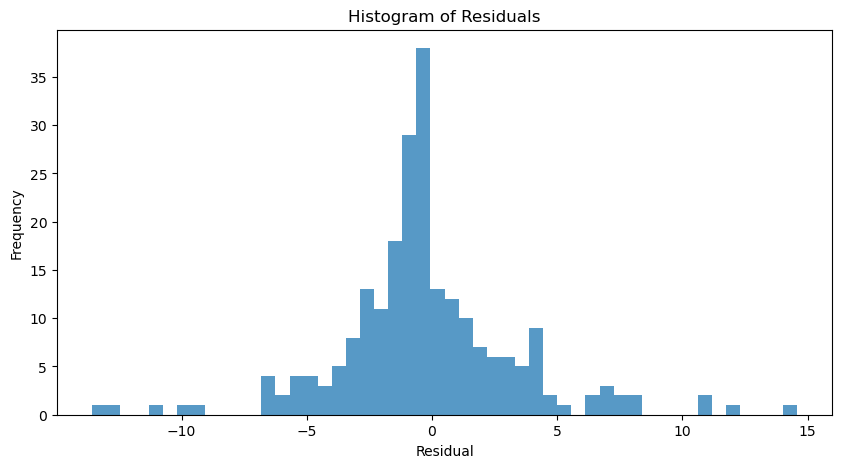

In [7]:
import torch
from torch_geometric.utils import k_hop_subgraph
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import networkx as nx
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 定义GATv2模型
class GATv2(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.bn1 = torch.nn.BatchNorm1d(hidden1)  # Batch normalization
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.bn2 = torch.nn.BatchNorm1d(hidden2)  # Batch normalization
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = self.bn1(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.conv2(x, edge_index)
        x = self.bn2(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.fc1(x)
        return x

def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    out = model(data.x, data.edge_index)
    loss = F.mse_loss(out, data.y)
    loss.backward()
    optimizer.step()
    return loss.item()

def evaluate(model, data):
    model.eval()
    with torch.no_grad():
        out = model(data.x, data.edge_index)
        loss = F.mse_loss(out, data.y).item()
    return loss

# 定义早停机制
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0.0):
        self.patience = patience
        self.min_delta = min_delta
        self.best_loss = float('inf')
        self.counter = 0

    def step(self, loss):
        if loss < self.best_loss - self.min_delta:
            self.best_loss = loss
            self.counter = 0
        else:
            self.counter += 1

        return self.counter >= self.patience

# 定义创建子图的函数，包括边界节点
def create_subgraph(data, train_idx, test_idx, num_hops):
    train_idx = torch.tensor(train_idx, dtype=torch.long, device=data.edge_index.device)
    test_idx = torch.tensor(test_idx, dtype=torch.long, device=data.edge_index.device)
    
    # 获取训练集子图，包含 train_idx 节点以及 num_hops 范围内的邻居
    train_subgraph = k_hop_subgraph(train_idx, num_hops, data.edge_index, relabel_nodes=True)
    train_edge_index, train_x, train_y = train_subgraph[1], data.x[train_subgraph[0]], data.y[train_subgraph[0]]
    
    # 获取测试集子图，包含 test_idx 节点以及 num_hops 范围内的邻居
    test_subgraph = k_hop_subgraph(test_idx, num_hops, data.edge_index, relabel_nodes=True)
    test_edge_index, test_x, test_y = test_subgraph[1], data.x[test_subgraph[0]], data.y[test_subgraph[0]]
    
    return (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y)

# 使用最佳参数重新训练模型并评估
def evaluate_leave_one_out(data, best_params, region_mask, num_hops=2):
    # 提取特定区域节点
    test_idx = torch.where(region_mask)[0].numpy()
    train_idx = np.setdiff1d(np.arange(data.num_nodes), test_idx)
    
    # 创建训练和测试子图
    (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y) = create_subgraph(data, train_idx, test_idx, num_hops)
    
    # 初始化模型和优化器
    model = GATv2(
        in_channels=train_x.shape[1], 
        hidden1=best_params['hidden1'], 
        hidden2=best_params['hidden2'], 
        out_channels=train_y.shape[1], 
        dropout=best_params['dropout']
    )
    optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])
    
    # 训练模型
    model.train()
    for epoch in range(best_params['num_epochs']):
        loss = train(model, optimizer, data)
        if (epoch + 1) % 10 == 0:
            print(f'Epoch {epoch + 1}/{best_params["num_epochs"]}, Loss: {loss:.4f}')
    
    # 测试模型
    model.eval()
    with torch.no_grad():
        pred = model(test_x, test_edge_index)
        y_true = test_y.numpy()
        y_pred = pred.numpy()
        
        mse = mean_squared_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)
    
    print(f'Test results - MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}, R²: {r2:.4f}')
    
    # 绘制残差图
    residuals = y_true - y_pred
    plt.figure(figsize=(10, 5))
    plt.hist(residuals, bins=50, alpha=0.75)
    plt.xlabel('Residual')
    plt.ylabel('Frequency')
    plt.title('Histogram of Residuals')
    plt.show()
    
    return mse, rmse, mae, r2

# 假设你已经有一个数据对象 data 和最佳参数 best_params
# data = ...
# best_params = ...

# 加载或创建GeoDataFrame gdf，这里假设gdf包含了每个节点的地理信息
# gdf = ...

# 假设LSOA21NM是GeoDataFrame中表示区域名称的列，并且我们要提取Southwark区域
region_name = 'Tower Hamlets'
region_mask = gdf['LSOA21NM'].str.contains(region_name)

# 将GeoDataFrame中的索引与图中的节点索引对齐，创建region_mask
region_mask = torch.tensor(region_mask.values, dtype=torch.bool, device=data.edge_index.device)

# 使用最佳参数重新训练模型并在特定区域上测试
mse, rmse, mae, r2 = evaluate_leave_one_out(data, best_params, region_mask)

Epoch 10/200, Loss: 246.4182
Epoch 20/200, Loss: 190.5119
Epoch 30/200, Loss: 137.7121
Epoch 40/200, Loss: 93.0029
Epoch 50/200, Loss: 58.9603
Epoch 60/200, Loss: 39.6511
Epoch 70/200, Loss: 31.4892
Epoch 80/200, Loss: 26.7136
Epoch 90/200, Loss: 25.1792
Epoch 100/200, Loss: 23.7473
Epoch 110/200, Loss: 21.1261
Epoch 120/200, Loss: 19.2910
Epoch 130/200, Loss: 18.8648
Epoch 140/200, Loss: 17.6901
Epoch 150/200, Loss: 17.1701
Epoch 160/200, Loss: 15.9217
Epoch 170/200, Loss: 15.8011
Epoch 180/200, Loss: 14.3668
Epoch 190/200, Loss: 14.2054
Epoch 200/200, Loss: 13.8356
Test results - MSE: 9.8709, RMSE: 3.1418, MAE: 2.1716, R²: 0.8468


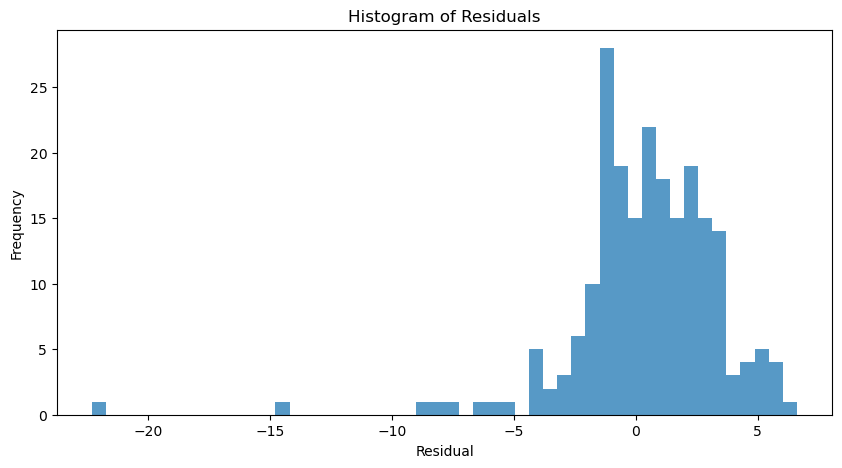

In [8]:
import torch
from torch_geometric.utils import k_hop_subgraph
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import networkx as nx
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 定义GATv2模型
class GATv2(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.bn1 = torch.nn.BatchNorm1d(hidden1)  # Batch normalization
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.bn2 = torch.nn.BatchNorm1d(hidden2)  # Batch normalization
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = self.bn1(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.conv2(x, edge_index)
        x = self.bn2(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.fc1(x)
        return x

def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    out = model(data.x, data.edge_index)
    loss = F.mse_loss(out, data.y)
    loss.backward()
    optimizer.step()
    return loss.item()

def evaluate(model, data):
    model.eval()
    with torch.no_grad():
        out = model(data.x, data.edge_index)
        loss = F.mse_loss(out, data.y).item()
    return loss

# 定义早停机制
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0.0):
        self.patience = patience
        self.min_delta = min_delta
        self.best_loss = float('inf')
        self.counter = 0

    def step(self, loss):
        if loss < self.best_loss - self.min_delta:
            self.best_loss = loss
            self.counter = 0
        else:
            self.counter += 1

        return self.counter >= self.patience

# 定义创建子图的函数，包括边界节点
def create_subgraph(data, train_idx, test_idx, num_hops):
    train_idx = torch.tensor(train_idx, dtype=torch.long, device=data.edge_index.device)
    test_idx = torch.tensor(test_idx, dtype=torch.long, device=data.edge_index.device)
    
    # 获取训练集子图，包含 train_idx 节点以及 num_hops 范围内的邻居
    train_subgraph = k_hop_subgraph(train_idx, num_hops, data.edge_index, relabel_nodes=True)
    train_edge_index, train_x, train_y = train_subgraph[1], data.x[train_subgraph[0]], data.y[train_subgraph[0]]
    
    # 获取测试集子图，包含 test_idx 节点以及 num_hops 范围内的邻居
    test_subgraph = k_hop_subgraph(test_idx, num_hops, data.edge_index, relabel_nodes=True)
    test_edge_index, test_x, test_y = test_subgraph[1], data.x[test_subgraph[0]], data.y[test_subgraph[0]]
    
    return (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y)

# 使用最佳参数重新训练模型并评估
def evaluate_leave_one_out(data, best_params, region_mask, num_hops=2):
    # 提取特定区域节点
    test_idx = torch.where(region_mask)[0].numpy()
    train_idx = np.setdiff1d(np.arange(data.num_nodes), test_idx)
    
    # 创建训练和测试子图
    (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y) = create_subgraph(data, train_idx, test_idx, num_hops)
    
    # 初始化模型和优化器
    model = GATv2(
        in_channels=train_x.shape[1], 
        hidden1=best_params['hidden1'], 
        hidden2=best_params['hidden2'], 
        out_channels=train_y.shape[1], 
        dropout=best_params['dropout']
    )
    optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])
    
    # 训练模型
    model.train()
    for epoch in range(best_params['num_epochs']):
        loss = train(model, optimizer, data)
        if (epoch + 1) % 10 == 0:
            print(f'Epoch {epoch + 1}/{best_params["num_epochs"]}, Loss: {loss:.4f}')
    
    # 测试模型
    model.eval()
    with torch.no_grad():
        pred = model(test_x, test_edge_index)
        y_true = test_y.numpy()
        y_pred = pred.numpy()
        
        mse = mean_squared_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)
    
    print(f'Test results - MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}, R²: {r2:.4f}')
    
    # 绘制残差图
    residuals = y_true - y_pred
    plt.figure(figsize=(10, 5))
    plt.hist(residuals, bins=50, alpha=0.75)
    plt.xlabel('Residual')
    plt.ylabel('Frequency')
    plt.title('Histogram of Residuals')
    plt.show()
    
    return mse, rmse, mae, r2

# 假设你已经有一个数据对象 data 和最佳参数 best_params
# data = ...
# best_params = ...

# 加载或创建GeoDataFrame gdf，这里假设gdf包含了每个节点的地理信息
# gdf = ...

# 假设LSOA21NM是GeoDataFrame中表示区域名称的列，并且我们要提取Southwark区域
region_name = 'Barking'
region_mask = gdf['LSOA21NM'].str.contains(region_name)

# 将GeoDataFrame中的索引与图中的节点索引对齐，创建region_mask
region_mask = torch.tensor(region_mask.values, dtype=torch.bool, device=data.edge_index.device)

# 使用最佳参数重新训练模型并在特定区域上测试
mse, rmse, mae, r2 = evaluate_leave_one_out(data, best_params, region_mask)

Epoch 10/200, Loss: 238.3921
Epoch 20/200, Loss: 182.6398
Epoch 30/200, Loss: 131.7812
Epoch 40/200, Loss: 88.6505
Epoch 50/200, Loss: 56.2538
Epoch 60/200, Loss: 37.9581
Epoch 70/200, Loss: 29.1087
Epoch 80/200, Loss: 25.7879
Epoch 90/200, Loss: 25.0480
Epoch 100/200, Loss: 22.1420
Epoch 110/200, Loss: 20.9334
Epoch 120/200, Loss: 19.7761
Epoch 130/200, Loss: 18.3289
Epoch 140/200, Loss: 17.9196
Epoch 150/200, Loss: 16.6105
Epoch 160/200, Loss: 16.4001
Epoch 170/200, Loss: 15.3497
Epoch 180/200, Loss: 14.3155
Epoch 190/200, Loss: 14.2735
Epoch 200/200, Loss: 13.7835
Test results - MSE: 9.3997, RMSE: 3.0659, MAE: 2.2602, R²: 0.8259


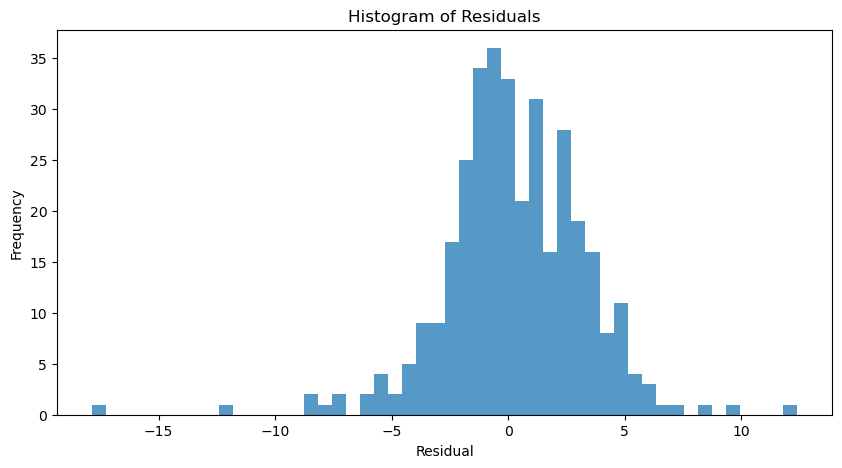

In [9]:
import torch
from torch_geometric.utils import k_hop_subgraph
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import networkx as nx
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 定义GATv2模型
class GATv2(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.bn1 = torch.nn.BatchNorm1d(hidden1)  # Batch normalization
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.bn2 = torch.nn.BatchNorm1d(hidden2)  # Batch normalization
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = self.bn1(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.conv2(x, edge_index)
        x = self.bn2(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.fc1(x)
        return x

def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    out = model(data.x, data.edge_index)
    loss = F.mse_loss(out, data.y)
    loss.backward()
    optimizer.step()
    return loss.item()

def evaluate(model, data):
    model.eval()
    with torch.no_grad():
        out = model(data.x, data.edge_index)
        loss = F.mse_loss(out, data.y).item()
    return loss

# 定义早停机制
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0.0):
        self.patience = patience
        self.min_delta = min_delta
        self.best_loss = float('inf')
        self.counter = 0

    def step(self, loss):
        if loss < self.best_loss - self.min_delta:
            self.best_loss = loss
            self.counter = 0
        else:
            self.counter += 1

        return self.counter >= self.patience

# 定义创建子图的函数，包括边界节点
def create_subgraph(data, train_idx, test_idx, num_hops):
    train_idx = torch.tensor(train_idx, dtype=torch.long, device=data.edge_index.device)
    test_idx = torch.tensor(test_idx, dtype=torch.long, device=data.edge_index.device)
    
    # 获取训练集子图，包含 train_idx 节点以及 num_hops 范围内的邻居
    train_subgraph = k_hop_subgraph(train_idx, num_hops, data.edge_index, relabel_nodes=True)
    train_edge_index, train_x, train_y = train_subgraph[1], data.x[train_subgraph[0]], data.y[train_subgraph[0]]
    
    # 获取测试集子图，包含 test_idx 节点以及 num_hops 范围内的邻居
    test_subgraph = k_hop_subgraph(test_idx, num_hops, data.edge_index, relabel_nodes=True)
    test_edge_index, test_x, test_y = test_subgraph[1], data.x[test_subgraph[0]], data.y[test_subgraph[0]]
    
    return (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y)

# 使用最佳参数重新训练模型并评估
def evaluate_leave_one_out(data, best_params, region_mask, num_hops=2):
    # 提取特定区域节点
    test_idx = torch.where(region_mask)[0].numpy()
    train_idx = np.setdiff1d(np.arange(data.num_nodes), test_idx)
    
    # 创建训练和测试子图
    (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y) = create_subgraph(data, train_idx, test_idx, num_hops)
    
    # 初始化模型和优化器
    model = GATv2(
        in_channels=train_x.shape[1], 
        hidden1=best_params['hidden1'], 
        hidden2=best_params['hidden2'], 
        out_channels=train_y.shape[1], 
        dropout=best_params['dropout']
    )
    optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])
    
    # 训练模型
    model.train()
    for epoch in range(best_params['num_epochs']):
        loss = train(model, optimizer, data)
        if (epoch + 1) % 10 == 0:
            print(f'Epoch {epoch + 1}/{best_params["num_epochs"]}, Loss: {loss:.4f}')
    
    # 测试模型
    model.eval()
    with torch.no_grad():
        pred = model(test_x, test_edge_index)
        y_true = test_y.numpy()
        y_pred = pred.numpy()
        
        mse = mean_squared_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)
    
    print(f'Test results - MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}, R²: {r2:.4f}')
    
    # 绘制残差图
    residuals = y_true - y_pred
    plt.figure(figsize=(10, 5))
    plt.hist(residuals, bins=50, alpha=0.75)
    plt.xlabel('Residual')
    plt.ylabel('Frequency')
    plt.title('Histogram of Residuals')
    plt.show()
    
    return mse, rmse, mae, r2

# 假设你已经有一个数据对象 data 和最佳参数 best_params
# data = ...
# best_params = ...

# 加载或创建GeoDataFrame gdf，这里假设gdf包含了每个节点的地理信息
# gdf = ...

# 假设LSOA21NM是GeoDataFrame中表示区域名称的列，并且我们要提取Southwark区域
region_name = 'Barnet'
region_mask = gdf['LSOA21NM'].str.contains(region_name)

# 将GeoDataFrame中的索引与图中的节点索引对齐，创建region_mask
region_mask = torch.tensor(region_mask.values, dtype=torch.bool, device=data.edge_index.device)

# 使用最佳参数重新训练模型并在特定区域上测试
mse, rmse, mae, r2 = evaluate_leave_one_out(data, best_params, region_mask)

Epoch 10/200, Loss: 270.1174
Epoch 20/200, Loss: 219.1379
Epoch 30/200, Loss: 167.5810
Epoch 40/200, Loss: 117.0668
Epoch 50/200, Loss: 75.5657
Epoch 60/200, Loss: 46.9033
Epoch 70/200, Loss: 31.9712
Epoch 80/200, Loss: 27.0296
Epoch 90/200, Loss: 23.6886
Epoch 100/200, Loss: 22.5280
Epoch 110/200, Loss: 20.8905
Epoch 120/200, Loss: 19.1805
Epoch 130/200, Loss: 18.2868
Epoch 140/200, Loss: 17.0530
Epoch 150/200, Loss: 16.6769
Epoch 160/200, Loss: 15.7283
Epoch 170/200, Loss: 15.0641
Epoch 180/200, Loss: 14.3624
Epoch 190/200, Loss: 13.9092
Epoch 200/200, Loss: 13.6387
Shape of conv1 embeddings: (4994, 128)
Shape of conv2 embeddings: (4994, 64)
Explained Variance Ratio: [0.73173165]
PCA1 Top Contributors:
43    0.019553
30    0.019288
58    0.019231
35    0.019091
46    0.018763
9     0.018535
50    0.018455
24    0.018376
15    0.018002
63    0.017953
62    0.017836
44    0.017812
13    0.017524
53    0.017120
40    0.017118
14    0.016627
20    0.016164
55    0.015862
3     0.015796
1

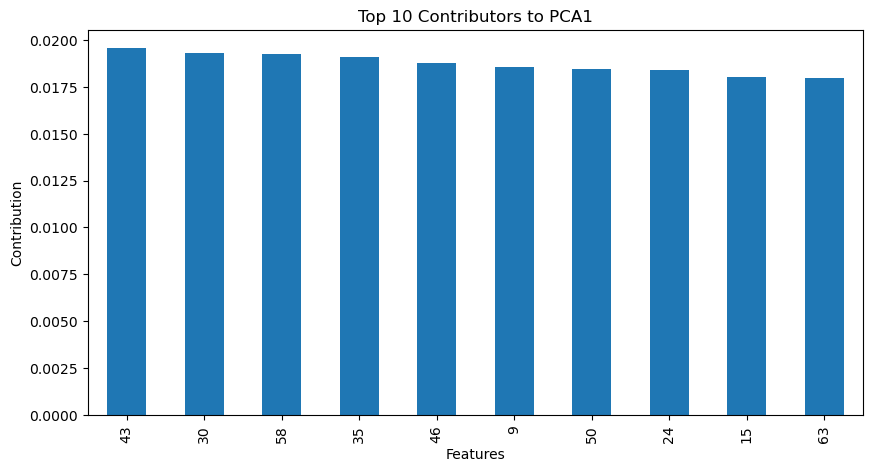

In [165]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd

# 定义GATv2模型
class GATv2(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.bn1 = torch.nn.BatchNorm1d(hidden1)  # Batch normalization
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.bn2 = torch.nn.BatchNorm1d(hidden2)  # Batch normalization
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = self.bn1(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        conv1_out = x  # 保存第一层卷积的输出
        x = self.conv2(x, edge_index)
        x = self.bn2(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        conv2_out = x  # 保存第二层卷积的输出
        x = self.fc1(x)
        return conv1_out, conv2_out, x

def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    _, _, out = model(data.x, data.edge_index)
    loss = F.mse_loss(out, data.y)
    loss.backward()
    optimizer.step()
    return loss.item()

def train_with_best_params(data, best_params, num_epochs=200):
    model = GATv2(
        in_channels=data.x.shape[1], 
        hidden1=best_params['hidden1'], 
        hidden2=best_params['hidden2'], 
        out_channels=data.y.shape[1], 
        dropout=best_params['dropout']
    )
    optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])
    
    losses = []
    for epoch in range(num_epochs):
        loss = train(model, optimizer, data)
        losses.append(loss)
        if (epoch + 1) % 10 == 0:
            print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {loss:.4f}')
    return model, losses

# 使用最佳参数训练模型
# 假设你已经有一个数据对象 data 和最佳参数 best_params
# best_params = {'lr': 0.005, 'weight_decay': 0.001, 'hidden1': 64, 'hidden2': 32, 'dropout': 0.5}
model, losses = train_with_best_params(data, best_params)

# 提取嵌入
model.eval()
with torch.no_grad():
    conv1_out, conv2_out, _ = model(data.x, data.edge_index)
    conv1_embeddings = conv1_out.cpu().numpy()
    conv2_embeddings = conv2_out.cpu().numpy()

# 确保嵌入已定义
print(f"Shape of conv1 embeddings: {conv1_embeddings.shape}")
print(f"Shape of conv2 embeddings: {conv2_embeddings.shape}")

# 确保 n_components 设置正确
pca_components = 1
if min(conv2_embeddings.shape) < pca_components:
    pca_components = min(conv2_embeddings.shape)

# 计算PCA并获取解释方差比
pca = PCA(n_components=pca_components, random_state=0)
pca_result = pca.fit_transform(conv2_embeddings)
explained_variance_ratio = pca.explained_variance_ratio_
print(f"Explained Variance Ratio: {explained_variance_ratio}")

# 计算载荷
loadings = pca.components_.T

# 计算特征贡献度（解释方差比乘以载荷的平方）
contributions = loadings ** 2 * explained_variance_ratio

# 创建贡献度矩阵DataFrame
contribution_matrix = pd.DataFrame(contributions, columns=[f'PCA{i+1}' for i in range(pca_components)])

# 打印每个主成分的前几个变量及其贡献
print("PCA1 Top Contributors:")
print(contribution_matrix['PCA1'].sort_values(ascending=False).head(20))

if pca_components > 1:
    print("\nPCA2 Top Contributors:")
    print(contribution_matrix['PCA2'].sort_values(ascending=False).head(20))

# 可视化每个主成分的前几个变量及其贡献
plt.figure(figsize=(10, 5))
contribution_matrix['PCA1'].sort_values(ascending=False).head(10).plot(kind='bar')
plt.title('Top 10 Contributors to PCA1')
plt.xlabel('Features')
plt.ylabel('Contribution')
plt.show()

if pca_components > 1:
    plt.figure(figsize=(10, 5))
    contribution_matrix['PCA2'].sort_values(ascending=False).head(10).plot(kind='bar')
    plt.title('Top 20 Contributors to PCA2')
    plt.xlabel('Features')
    plt.ylabel('Contribution')
    plt.show()

In [166]:
def plot_variable_v2(gdf, variable, variable_name):

    if variable.startswith('e'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#c27ba0'])
    elif variable.startswith('o'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#6d9eeb'])
    elif variable.startswith('c'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#008080'])
    else:
        colormap = 'coolwarm'

    # Parameters to display missing data in black
    missing_data_color = {
        'color': 'black',
        # 'color':'#808080',
        # 'edgecolor': 'black',
        # 'hatch': '///',  # this is optional, if you'd like a hatch pattern for missing data
        'label': 'Missing Data'
    }

    # Plotting the GeoPandas DataFrame
    ax = gdf.plot(column=variable, legend=True, figsize=(15, 10), cmap=colormap, missing_kwds=missing_data_color)

    # Remove the axes
    plt.axis('off')

    # Customize the legend font size
    # Get the color bar object
    cax = plt.gcf().axes[-1]

    # Customize the color bar font size
    cax.tick_params(labelsize=33)

    # Title
    plt.title(variable_name, fontsize=44)

    return plt

<module 'matplotlib.pyplot' from 'C:\\Users\\0\\anaconda3\\envs\\envGEOG0051\\Lib\\site-packages\\matplotlib\\pyplot.py'>

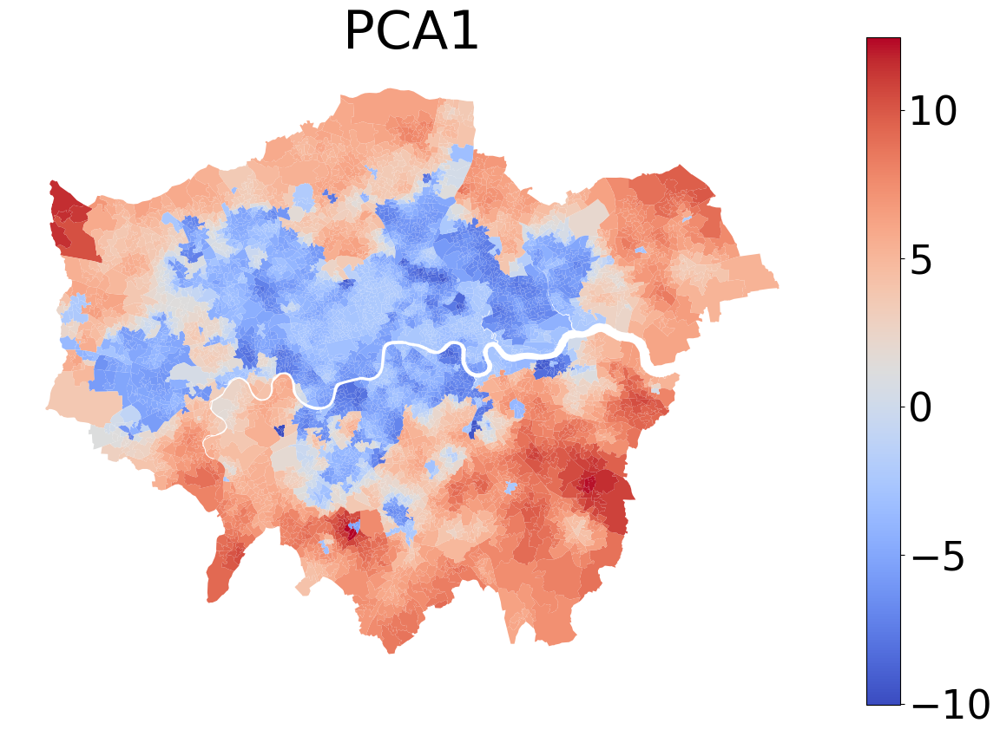

In [167]:
import pandas as pd
import geopandas as gpd
from shapely import wkt

# Read the CSV file
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# Convert the 'geometry' column to Shapely geometry objects
df['geometry'] = df['geometry'].apply(wkt.loads)

# Create the GeoDataFrame
gdf_plot = gpd.GeoDataFrame(df, geometry='geometry')

# 将PCA结果添加到GeoDataFrame中
gdf_plot['PCA1'] = pca_result[:, 0]
# gdf_plot['PCA2'] = pca_result[:, 1]
# gdf_plot['PCA3'] = pca_result[:, 2]

# 可视化PCA1和PCA2
plot_variable_v2(gdf_plot, 'PCA1', 'PCA1')
# plot_variable_v2(gdf_plot, 'PCA2', 'PCA2')
# plot_variable_v2(gdf_plot, 'PCA3', 'PCA3')

Correlation with PCA components:
                                                        PCA1
c_percent Aged 10 to 14 years                       0.245794
c_percent Aged 15 to 19 years                       0.035339
c_percent Aged 20 to 24 years                      -0.401425
c_percent Aged 25 to 29 years                      -0.529959
c_percent Aged 30 to 34 years                      -0.488509
c_percent Aged 35 to 39 years                      -0.310012
c_percent Aged 40 to 44 years                       0.025523
c_percent Aged 65 to 69 years                       0.440535
c_percent Aged 70 to 74 years                       0.527558
c_percent Aged 75 to 79 years                       0.509877
c_percent Aged 80 to 84 years                       0.465663
c_percent Aged 85 years and over                    0.452324
c_percent mixed                                    -0.156023
c_percent white                                     0.484514
c_percent 2. Professional occupations              -

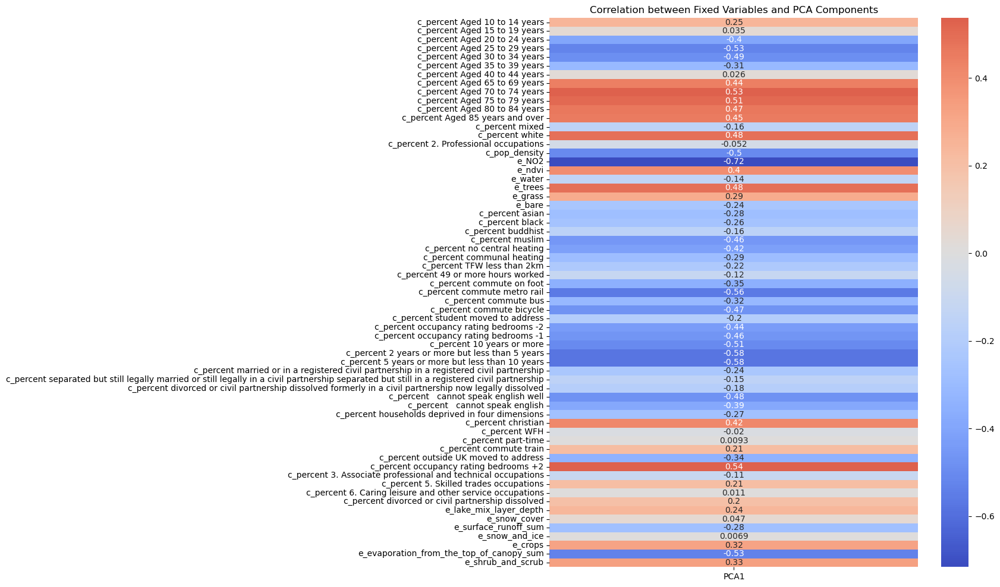

In [168]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
import seaborn as sns
# 提取PCA主成分
pca_df = pd.DataFrame(pca_result, columns=[f'PCA{i+1}' for i in range(pca_components)])

# 读取CSV文件并创建GeoDataFrame
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# 创建几何对象（假设geometry列包含WKT格式的多边形数据）
gdf = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkt(df['geometry']))

# 设置坐标系 (假设是WGS84坐标系)
gdf.set_crs(epsg=4326, inplace=True)
# 固定选取的变量
fixed_columns = [
    'c_percent Aged 10 to 14 years', 'c_percent Aged 15 to 19 years',
       'c_percent Aged 20 to 24 years', 'c_percent Aged 25 to 29 years',
       'c_percent Aged 30 to 34 years', 'c_percent Aged 35 to 39 years',
       'c_percent Aged 40 to 44 years', 'c_percent Aged 65 to 69 years',
       'c_percent Aged 70 to 74 years', 'c_percent Aged 75 to 79 years',
       'c_percent Aged 80 to 84 years', 'c_percent Aged 85 years and over',
       'c_percent mixed', 'c_percent white',
       'c_percent 2. Professional occupations', 'c_pop_density', 'e_NO2',
       'e_ndvi', 'e_water', 'e_trees', 'e_grass', 'e_bare', 'c_percent asian',
       'c_percent black', 'c_percent buddhist', 'c_percent muslim',
       'c_percent no central heating', 'c_percent communal heating',
       'c_percent TFW less than 2km', 'c_percent 49 or more hours worked',
       'c_percent commute on foot', 'c_percent commute metro rail',
       'c_percent commute bus', 'c_percent commute bicycle',
       'c_percent student moved to address',
       'c_percent occupancy rating bedrooms -2',
       'c_percent occupancy rating bedrooms -1', 'c_percent 10 years or more',
       'c_percent 2 years or more but less than 5 years',
       'c_percent 5 years or more but less than 10 years',
       # 'c_percent married or in a registered civil partnership married same sex',
       'c_percent married or in a registered civil partnership in a registered civil partnership',
       'c_percent separated but still legally married or still legally in a civil partnership separated but still in a registered civil partnership',
       'c_percent divorced or civil partnership dissolved formerly in a civil partnership now legally dissolved',
       'c_percent   cannot speak english well',
       'c_percent   cannot speak english',
       'c_percent households deprived in four dimensions',
       'c_percent christian', 'c_percent WFH', 'c_percent part-time',
       'c_percent commute train', 'c_percent outside UK moved to address',
       'c_percent occupancy rating bedrooms +2',
       'c_percent 3. Associate professional and technical occupations',
       'c_percent 5. Skilled trades occupations',
       'c_percent 6. Caring leisure and other service occupations',
       'c_percent divorced or civil partnership dissolved',
       'e_lake_mix_layer_depth', 'e_snow_cover', 'e_surface_runoff_sum',
       'e_snow_and_ice', 'e_crops', 'e_evaporation_from_the_top_of_canopy_sum',
       'e_shrub_and_scrub'
]
# 提取固定变量
fixed_features = gdf[fixed_columns].apply(pd.to_numeric, errors='coerce')

# 标准化固定变量
scaler = StandardScaler()
fixed_features_scaled = scaler.fit_transform(fixed_features)
fixed_features_df = pd.DataFrame(fixed_features_scaled, columns=fixed_columns)

# 计算PCA主成分与固定变量的相关性
correlation_matrix = fixed_features_df.join(pca_df).corr()
pca_corr = correlation_matrix.loc[fixed_columns, [f'PCA{i+1}' for i in range(pca_components)]]

# 打印相关性矩阵
print("Correlation with PCA components:")
print(pca_corr)

# 可视化相关性矩阵
plt.figure(figsize=(10, 12))
sns.heatmap(pca_corr, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation between Fixed Variables and PCA Components')
plt.show()

In [169]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd

# 定义GATv2模型
class GATv2(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.bn1 = torch.nn.BatchNorm1d(hidden1)  # Batch normalization
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.bn2 = torch.nn.BatchNorm1d(hidden2)  # Batch normalization
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = self.bn1(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        conv1_out = x  # 保存第一层卷积的输出
        x = self.conv2(x, edge_index)
        x = self.bn2(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        conv2_out = x  # 保存第二层卷积的输出
        x = self.fc1(x)
        return conv1_out, conv2_out, x

# 包装模型，只返回最终的输出
class WrappedModel(torch.nn.Module):
    def __init__(self, model):
        super(WrappedModel, self).__init__()
        self.model = model

    def forward(self, x, edge_index):
        _, _, out = self.model(x, edge_index)
        return out

def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    _, _, out = model(data.x, data.edge_index)  # Unpack the tuple and use only the final output
    loss = F.mse_loss(out, data.y)
    loss.backward()
    optimizer.step()
    return loss.item()

# Assuming 'data' is a pre-defined PyG data object
model = GATv2(
    in_channels=data.x.shape[1], 
    hidden1=best_params['hidden1'], 
    hidden2=best_params['hidden2'], 
    out_channels=data.y.shape[1], 
    dropout=best_params['dropout']
)
wrapped_model = WrappedModel(model)
optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])

losses = []
for epoch in range(best_params['num_epochs']):
    loss = train(model, optimizer, data)
    losses.append(loss)

# 测试模型并计算评估指标
model.eval()
with torch.no_grad():
    _, _, pred = model(data.x, data.edge_index)  # Unpack the tuple and use only the final output
    residuals = data.y - pred

from torch_geometric.explain import Explainer, GNNExplainer
from tqdm import tqdm
wrapped_model.eval()

WrappedModel(
  (model): GATv2(
    (conv1): GATv2Conv(63, 128, heads=1)
    (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): GATv2Conv(128, 64, heads=1)
    (bn2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=64, out_features=1, bias=True)
  )
)

In [170]:
data

Data(edge_index=[2, 29472], pos=[4994, 2], weight=[29472], x=[4994, 63], y=[4994, 1])

In [222]:
for explanation_type in ['model']:
    explainer = Explainer(
        model=wrapped_model,
        algorithm=GNNExplainer(epochs=200),
        explanation_type=explanation_type,
        node_mask_type='object',
        edge_mask_type='object',
        model_config=dict(
            mode='regression',
            task_level='node',
            return_type='raw',
        ),
        # threshold_config=dict(threshold_type='hard', value=0.5) 
    )

# 选择一个节点进行解释（例如，节点0）
node_idx = 3455
explanation = explainer(data.x, data.edge_index, index=node_idx, target = data.y,)

# 输出解释结果
print(f'Generated explanations in {explanation.available_explanations}')

# 可视化特征重要性
# path = 'feature_importance.png'
# explanation.visualize_feature_importance(path, top_k=10)
# print(f"Feature importance plot has been saved to '{path}'")

# # 可视化子图
# path = 'subgraph.pdf'
# explanation.visualize_graph(path)
# print(f"Subgraph visualization plot has been saved to '{path}'")

# 获取子图节点索引
edge_mask = explanation.edge_mask > 0  # 使用掩码阈值
edge_index = data.edge_index[:, edge_mask]
node_indices = edge_index.unique().tolist()

C:\Users\0\anaconda3\envs\envGEOG0051\Lib\site-packages\torch_geometric\explain\explainer.py:193: UserWarning: The 'target' should not be provided for the explanation type 'model'
  warnings.warn(


Generated explanations in ['node_mask', 'edge_mask']


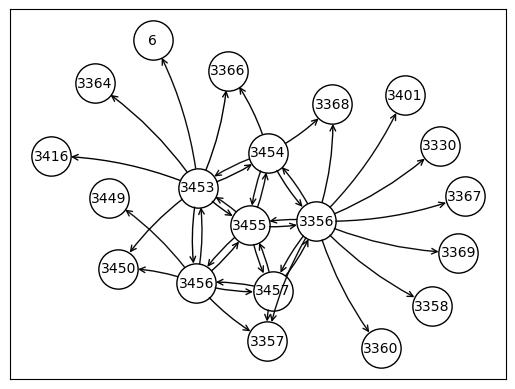

In [278]:
explanation.visualize_graph()

In [172]:
# 获取每个节点对应的 node_mask 值
node_mask_values = [explanation.node_mask[idx].item() for idx in node_indices]

# 打印所有索引和对应的 node_mask 值，并保留四位小数
for idx, mask_value in zip(node_indices, node_mask_values):
    print(f"Node: {idx}, value: {mask_value:.4f}")

Node: 1719, value: 0.2423
Node: 1726, value: 0.1363
Node: 1728, value: 0.1193
Node: 1935, value: 0.1483
Node: 1948, value: 0.6822
Node: 1950, value: 0.6659
Node: 1953, value: 0.2327
Node: 1964, value: 0.7674
Node: 1966, value: 0.7360
Node: 1969, value: 0.7337
Node: 1970, value: 0.7048
Node: 1973, value: 0.6070
Node: 1974, value: 0.7622
Node: 1975, value: 0.6998
Node: 1976, value: 0.7596
Node: 1977, value: 0.6171
Node: 1978, value: 0.6449
Node: 4157, value: 0.6755
Node: 4158, value: 0.3649
Node: 4159, value: 0.4016
Node: 4160, value: 0.3630
Node: 4161, value: 0.2274
Node: 4164, value: 0.1433
Node: 4166, value: 0.7274
Node: 4167, value: 0.7008
Node: 4168, value: 0.4118
Node: 4170, value: 0.3024
Node: 4724, value: 0.6924
Node: 4725, value: 0.7348
Node: 4854, value: 0.3574
Node: 4855, value: 0.5435


In [173]:
# 获取大于0的 edge_mask 值及其对应的边的索引
edge_mask_values = explanation.edge_mask.detach().cpu().numpy()
edge_indices = data.edge_index.detach().cpu().numpy()

# 遍历 edge_mask，找到大于0且包含节点408的值及其索引
for i, mask_value in enumerate(edge_mask_values):
    if mask_value > 0:
        source, target = edge_indices[:, i]
        # if source == 408 or target == 408:
        print(f"Edge ({source}, {target}), value: {mask_value:.4f}")

Edge (1719, 1950), value: 0.9332
Edge (1726, 1950), value: 0.0859
Edge (1728, 1950), value: 0.0864
Edge (1935, 4167), value: 0.8741
Edge (1948, 1950), value: 0.0839
Edge (1948, 1966), value: 0.6549
Edge (1950, 1966), value: 0.0834
Edge (1950, 1976), value: 0.7361
Edge (1950, 4157), value: 0.1944
Edge (1953, 1950), value: 0.9173
Edge (1964, 1966), value: 0.7479
Edge (1964, 4725), value: 0.7177
Edge (1966, 1950), value: 0.7404
Edge (1966, 1976), value: 0.7420
Edge (1966, 4725), value: 0.7341
Edge (1969, 1966), value: 0.7439
Edge (1970, 1966), value: 0.7330
Edge (1973, 4724), value: 0.7461
Edge (1973, 4167), value: 0.7266
Edge (1974, 4724), value: 0.7374
Edge (1975, 4724), value: 0.7153
Edge (1976, 1950), value: 0.7228
Edge (1976, 1966), value: 0.7660
Edge (1976, 4157), value: 0.6771
Edge (1976, 4725), value: 0.7172
Edge (1976, 4724), value: 0.7098
Edge (1976, 4167), value: 0.6326
Edge (1977, 4724), value: 0.6858
Edge (1978, 4725), value: 0.7441
Edge (1978, 4724), value: 0.7155
Edge (4157

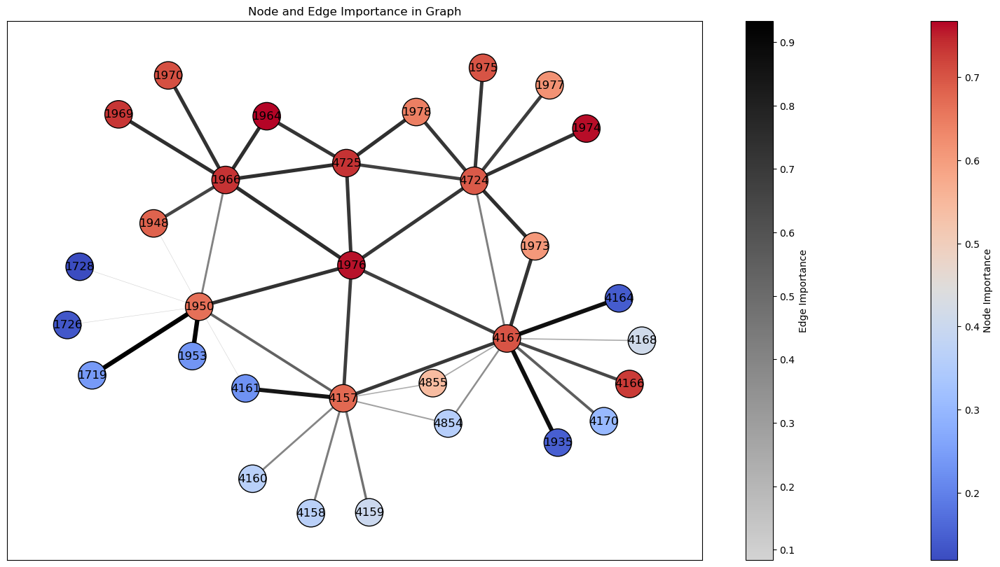

In [174]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# 创建无向图
G = nx.Graph()

# 获取节点的重要性值
node_mask_values = {idx: explanation.node_mask[idx].item() for idx in node_indices}

# 添加节点和节点的重要性值作为属性
for idx, value in node_mask_values.items():
    G.add_node(idx, importance=value)

# 合成无向边并计算边的重要性
edge_importance = {}
for i, mask_value in enumerate(edge_mask_values):
    if mask_value > 0:
        source, target = edge_indices[:, i]
        if source > target:  # 确保无向边的一致性
            source, target = target, source
        if (source, target) in edge_importance:
            edge_importance[(source, target)].append(mask_value)
        else:
            edge_importance[(source, target)] = [mask_value]

# 计算每条无向边的重要性，对于只有一条有向边的情况直接使用该重要性值
edge_importance = {
    edge: np.mean(values) if len(values) > 1 else values[0] for edge, values in edge_importance.items()
}

# 添加边和边的重要性值作为属性
for (source, target), importance in edge_importance.items():
    G.add_edge(source, target, importance=importance)

# 确保所有节点都在图中，即使它们没有连接
isolated_nodes = set(node_mask_values.keys()) - set(G.nodes)
for node in isolated_nodes:
    G.add_node(node, importance=node_mask_values[node])

# 绘制图形
fig, ax = plt.subplots(figsize=(20, 10))  # 调整图的大小
pos = nx.spring_layout(G, k=0.3)  # 调整spring_layout参数以更好地分布节点

# 设置绘图窗口和节点图的背景颜色为淡黄色
# fig.set_facecolor('lightyellow')
# ax.set_facecolor('lightyellow')

# 自定义色图，最低值为灰色，最高值为黑色
cmap = mcolors.LinearSegmentedColormap.from_list('grey_black', ['lightgrey', 'black'])

# 确保所有节点都有 'importance' 属性，提供默认值0
for node in G.nodes:
    if 'importance' not in G.nodes[node]:
        G.nodes[node]['importance'] = 0

# 绘制节点，颜色根据重要性值进行渐变
node_colors = [G.nodes[node]['importance'] for node in G.nodes]
nodes = nx.draw_networkx_nodes(
    G, pos, node_color=node_colors, cmap=plt.cm.coolwarm, node_size=800, edgecolors='black', ax=ax
)
nx.draw_networkx_labels(G, pos, ax=ax)

# 绘制边，颜色和粗细根据重要性值进行调整
edge_widths = [G[u][v]['importance'] * 5 for u, v in G.edges]  # 调整乘数以获得适合的宽度
edge_colors = [G[u][v]['importance'] for u, v in G.edges]
edges = nx.draw_networkx_edges(
    G, pos, width=edge_widths, edge_color=edge_colors, edge_cmap=cmap, ax=ax
)

# 添加颜色条以显示重要性
sm = plt.cm.ScalarMappable(cmap=plt.cm.coolwarm, norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
sm._A = []
plt.colorbar(sm, ax=ax, label='Node Importance')

sm_edges = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(edge_colors), vmax=max(edge_colors)))
sm_edges._A = []
plt.colorbar(sm_edges, ax=ax, label='Edge Importance')

plt.title("Node and Edge Importance in Graph")
plt.show()


Node indices: [ 824  828  829  897  898  899  900  901  909  910  911  912  913  914
  915 2560 2563 2566 2573 2574 2575 2576 2577 2578 2579 2580 2593 2594
 2627 4978 4979 4980 4981 4982 4983]
Edge indices: [ 4909  4911  4932  4934  4935  4936  5348  5350  5351  5352  5357  5360
  5361  5362  5365  5368  5373  5418  5419  5424  5428  5429  5430  5435
  5436  5439  5440  5441  5445  5447  5448  5452 15207 15228 15229 15247
 15287 15288 15289 15295 15296 15297 15303 15304 15305 15307 15308 15310
 15311 15314 15319 15327 15328 15331 15332 15405 15408 15411 15609 29348
 29351 29352 29354 29355 29356 29357 29358 29359 29360 29361 29362 29363
 29364 29368 29369 29370 29380 29389 29393 29394]
Node positions: {824: (529140.5098928496, 183934.15041933223), 828: (529285.9970832281, 184296.3161472563), 829: (529880.6975901545, 184242.86442630226), 897: (530456.6055909371, 182378.84715125026), 898: (530617.2792977298, 182854.57138226245), 899: (530421.3263154083, 182792.65512189697), 900: (530288.

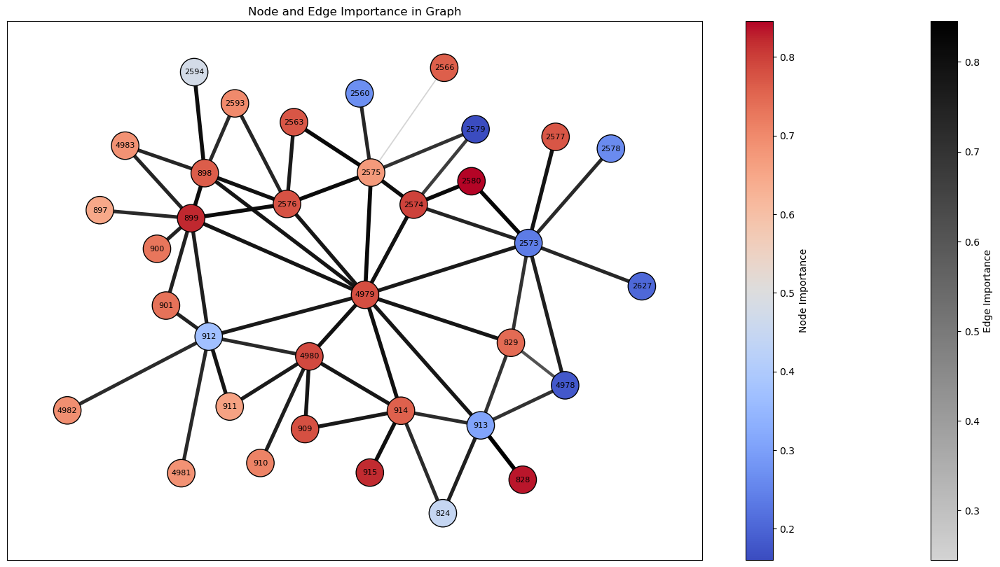

In [221]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# 获取解释子图中的节点
node_indices = np.where(explanation.node_mask > 0)[0]
edge_indices = np.where(explanation.edge_mask > 0)[0]

# 获取节点的位置数据
node_positions = data.pos.numpy()

# 创建无向图
G = nx.Graph()

# 获取节点的重要性值
node_mask_values = {idx: explanation.node_mask[idx].item() for idx in node_indices}

# 添加解释子图中的节点和节点的重要性值作为属性
for idx in node_indices:
    value = explanation.node_mask[idx].item()
    lat, lon = node_positions[idx]
    G.add_node(int(idx), importance=value, pos=(lon, lat))

# 合成无向边并计算边的重要性
edge_importance = {}
for i in edge_indices:
    mask_value = explanation.edge_mask[i].item()
    source, target = data.edge_index[:, i]
    if source.item() in node_indices and target.item() in node_indices:  # 仅添加解释子图中的边
        if source.item() > target.item():  # 确保无向边的一致性
            source, target = target, source
        if (source.item(), target.item()) in edge_importance:
            edge_importance[(source.item(), target.item())].append(mask_value)
        else:
            edge_importance[(source.item(), target.item())] = [mask_value]

# 输出调试信息
print("Node indices:", node_indices)
print("Edge indices:", edge_indices)
print("Node positions:", {idx: (node_positions[idx][0], node_positions[idx][1]) for idx in node_indices})
print("Edge importance:", edge_importance)

# 计算每条无向边的重要性，对于只有一条有向边的情况直接使用该重要性值
edge_importance = {
    edge: np.mean(values) if len(values) > 1 else values[0] for edge, values in edge_importance.items()
}

# 添加边和边的重要性值作为属性
for (source, target), importance in edge_importance.items():
    G.add_edge(source, target, importance=importance)

# 获取节点位置
pos = nx.get_node_attributes(G, 'pos')

# 绘制图形
fig, ax = plt.subplots(figsize=(20, 10))  # 调整图的大小

# 设置绘图窗口和节点图的背景颜色为淡黄色
# fig.set_facecolor('lightyellow')
# ax.set_facecolor('lightyellow')

# 自定义色图，最低值为灰色，最高值为黑色
cmap = mcolors.LinearSegmentedColormap.from_list('grey_black', ['lightgrey', 'black'])

# 绘制节点，颜色根据重要性值进行渐变
node_colors = [G.nodes[node]['importance'] for node in G.nodes]
nodes = nx.draw_networkx_nodes(
    G, pos, node_color=node_colors, cmap=plt.cm.coolwarm, node_size=800, edgecolors='black', ax=ax
)
nx.draw_networkx_labels(G, pos, ax=ax, font_size=8)

# 确保有边被添加到图中
if len(G.edges) > 0:
    # 绘制边，颜色和粗细根据重要性值进行调整
    edge_widths = [G[u][v]['importance'] * 5 for u, v in G.edges]  # 调整乘数以获得适合的宽度
    edge_colors = [G[u][v]['importance'] for u, v in G.edges]
    edges = nx.draw_networkx_edges(
        G, pos, width=edge_widths, edge_color=edge_colors, edge_cmap=cmap, ax=ax
    )

    # 添加颜色条以显示重要性
    sm_edges = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(edge_colors), vmax=max(edge_colors)))
    sm_edges._A = []
    plt.colorbar(sm_edges, ax=ax, label='Edge Importance')

# 添加节点的重要性颜色条
sm = plt.cm.ScalarMappable(cmap=plt.cm.coolwarm, norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
sm._A = []
plt.colorbar(sm, ax=ax, label='Node Importance')

plt.title("Node and Edge Importance in Graph")
plt.show()


Node indices: [1719 1726 1728 1935 1948 1950 1953 1964 1966 1969 1970 1973 1974 1975
 1976 1977 1978 4157 4158 4159 4160 4161 4164 4166 4167 4168 4170 4724
 4725 4854 4855]
Edge indices: [10255 10290 10302 11523 11599 11600 11611 11612 11614 11630 11696 11698
 11708 11712 11713 11728 11734 11752 11754 11758 11764 11766 11767 11768
 11769 11770 11771 11775 11779 11780 24626 24627 24634 24635 24643 24647
 24656 24657 24678 24689 24692 24693 24698 24702 24715 27932 27935 27936
 27938 27939 27941 28638 28641 28645 28646]
Node positions: {1719: (533824.1647025429, 187962.01866907725), 1726: (534424.1545009762, 187990.27956893836), 1728: (534154.3608210605, 187990.00989521694), 1935: (535042.5566988197, 191320.97913156307), 1948: (533970.0649987321, 188480.56545424278), 1950: (534270.1871230139, 188553.99518077535), 1953: (533714.110889741, 188184.96733736672), 1964: (533805.1336216481, 189404.09445548008), 1966: (534213.8942198408, 189144.45561758926), 1969: (533944.2000506457, 189070.47661

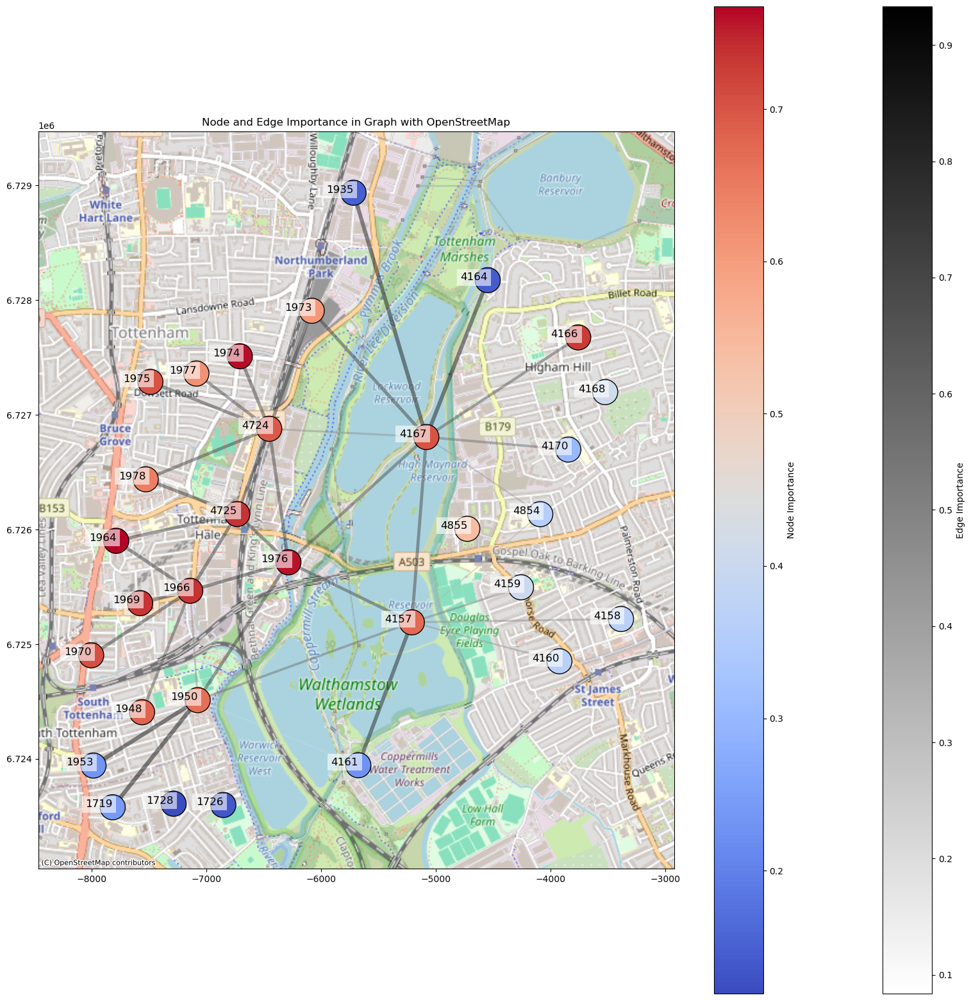

In [207]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
import geopandas as gpd
from shapely.geometry import Point
import contextily as ctx

# 获取解释子图中的节点
node_indices = np.where(explanation.node_mask > 0)[0]
edge_indices = np.where(explanation.edge_mask > 0)[0]

# 获取节点的位置数据
node_positions = data.pos.numpy()

# 创建无向图
G = nx.Graph()

# 获取节点的重要性值
node_mask_values = {idx: explanation.node_mask[idx].item() for idx in node_indices}

# 添加解释子图中的节点和节点的重要性值作为属性
for idx in node_indices:
    value = explanation.node_mask[idx].item()
    lat, lon = node_positions[idx]
    G.add_node(int(idx), importance=value, pos=(lon, lat))

# 合成无向边并计算边的重要性
edge_importance = {}
for i in edge_indices:
    mask_value = explanation.edge_mask[i].item()
    source, target = data.edge_index[:, i]
    if source.item() in node_indices and target.item() in node_indices:  # 仅添加解释子图中的边
        if source.item() > target.item():  # 确保无向边的一致性
            source, target = target, source
        if (source.item(), target.item()) in edge_importance:
            edge_importance[(source.item(), target.item())].append(mask_value)
        else:
            edge_importance[(source.item(), target.item())] = [mask_value]

# 输出调试信息
print("Node indices:", node_indices)
print("Edge indices:", edge_indices)
print("Node positions:", {idx: (node_positions[idx][0], node_positions[idx][1]) for idx in node_indices})
print("Edge importance:", edge_importance)

# 计算每条无向边的重要性，对于只有一条有向边的情况直接使用该重要性值
edge_importance = {
    edge: np.mean(values) if len(values) > 1 else values[0] for edge, values in edge_importance.items()
}

# 添加边和边的重要性值作为属性
for (source, target), importance in edge_importance.items():
    G.add_edge(source, target, importance=importance)

# 获取节点位置
pos = nx.get_node_attributes(G, 'pos')

# 将节点位置转换为GeoDataFrame
geometry = [Point(lon, lat) for lat, lon in pos.values()]
node_importance = [G.nodes[node]['importance'] for node in G.nodes]
gdf = gpd.GeoDataFrame(list(pos.keys()), geometry=geometry, columns=['node'])
gdf['importance'] = node_importance

# 设置原始坐标系为EPSG:27700（英国国家格网）
gdf.set_crs(epsg=27700, inplace=True)
# 转换为WGS84坐标系（EPSG:4326）
gdf = gdf.to_crs(epsg=4326)

# 转换为墨卡托投影以匹配OpenStreetMap
gdf = gdf.to_crs(epsg=3857)

# 调试信息：检查转换后的坐标和边界框值
print("Converted coordinates:\n", gdf)
bounds = gdf.total_bounds  # 获取GeoDataFrame的边界框 [minx, miny, maxx, maxy]
print("Bounds:", bounds)

# 绘制图形
fig, ax = plt.subplots(figsize=(20, 20))

# 设置地图范围
if np.isfinite(bounds).all():
    x_buffer = (bounds[2] - bounds[0]) * 0.1
    y_buffer = (bounds[3] - bounds[1]) * 0.1
    ax.set_xlim([bounds[0] - x_buffer, bounds[2] + x_buffer])
    ax.set_ylim([bounds[1] - y_buffer, bounds[3] + y_buffer])
else:
    print("Invalid bounds detected, skipping axis limits setting")

# 添加OpenStreetMap底图
ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# 绘制GeoDataFrame并使用importance列作为颜色
gdf.plot(ax=ax, column='importance', cmap=plt.cm.coolwarm, markersize=800, edgecolor='black', zorder=5)

# 确保有边被添加到图中
if len(G.edges) > 0:
    # 绘制边，颜色和粗细根据重要性值进行调整
    for (source, target), importance in edge_importance.items():
        source_pos = gdf.loc[gdf['node'] == source, 'geometry'].values[0]
        target_pos = gdf.loc[gdf['node'] == target, 'geometry'].values[0]
        ax.plot([source_pos.x, target_pos.x], [source_pos.y, target_pos.y], 
                color=plt.cm.binary(importance), linewidth=5*importance, alpha=0.5, zorder=1)

    # 添加颜色条以显示边的重要性
    sm_edges = plt.cm.ScalarMappable(cmap=plt.cm.binary, norm=plt.Normalize(vmin=min(edge_importance.values()), vmax=max(edge_importance.values())))
    sm_edges._A = []
    plt.colorbar(sm_edges, ax=ax, label='Edge Importance')

# 添加节点的重要性颜色条
sm = plt.cm.ScalarMappable(cmap=plt.cm.coolwarm, norm=plt.Normalize(vmin=min(node_importance), vmax=max(node_importance)))
sm._A = []
plt.colorbar(sm, ax=ax, label='Node Importance')

# 添加节点标签
for node, (lat, lon) in pos.items():
    point = gpd.GeoSeries([Point(lon, lat)], crs="EPSG:27700").to_crs("EPSG:3857").geometry[0]
    ax.text(point.x, point.y, str(node), fontsize=12, ha='right', zorder=10, bbox=dict(facecolor='white', alpha=0.6, edgecolor='none'))

plt.title("Node and Edge Importance in Graph with OpenStreetMap")
plt.show()


Node indices: [   6 3330 3356 3357 3358 3360 3364 3366 3367 3368 3369 3401 3416 3449
 3450 3453 3454 3455 3456 3457]
Edge indices: [   36 19770 19926 19928 19931 19933 19938 19939 19940 19954 19974 19986
 19987 19990 19996 20000 20002 20199 20295 20484 20491 20492 20507 20508
 20509 20510 20513 20514 20515 20516 20517 20518 20519 20523 20524 20525
 20526 20528 20529]
Node positions: {6: (543631.4493965654, 184385.2518637335), 3330: (541865.8602534509, 183707.02637275247), 3356: (542264.0216580781, 184080.49691803806), 3357: (542542.153034213, 183814.16829912883), 3358: (542179.6139092873, 183835.86937817014), 3360: (542042.4046183934, 183582.56188435626), 3364: (542939.9328797493, 184910.4946108677), 3366: (542767.8461111177, 184716.5253453401), 3367: (542071.948306461, 184407.99893054357), 3368: (542511.7698517095, 184487.42806677107), 3369: (541781.4639524732, 184246.75184527415), 3401: (541589.927801801, 184072.9923582584), 3416: (543336.1992768531, 185170.80656443178), 3449: (54304

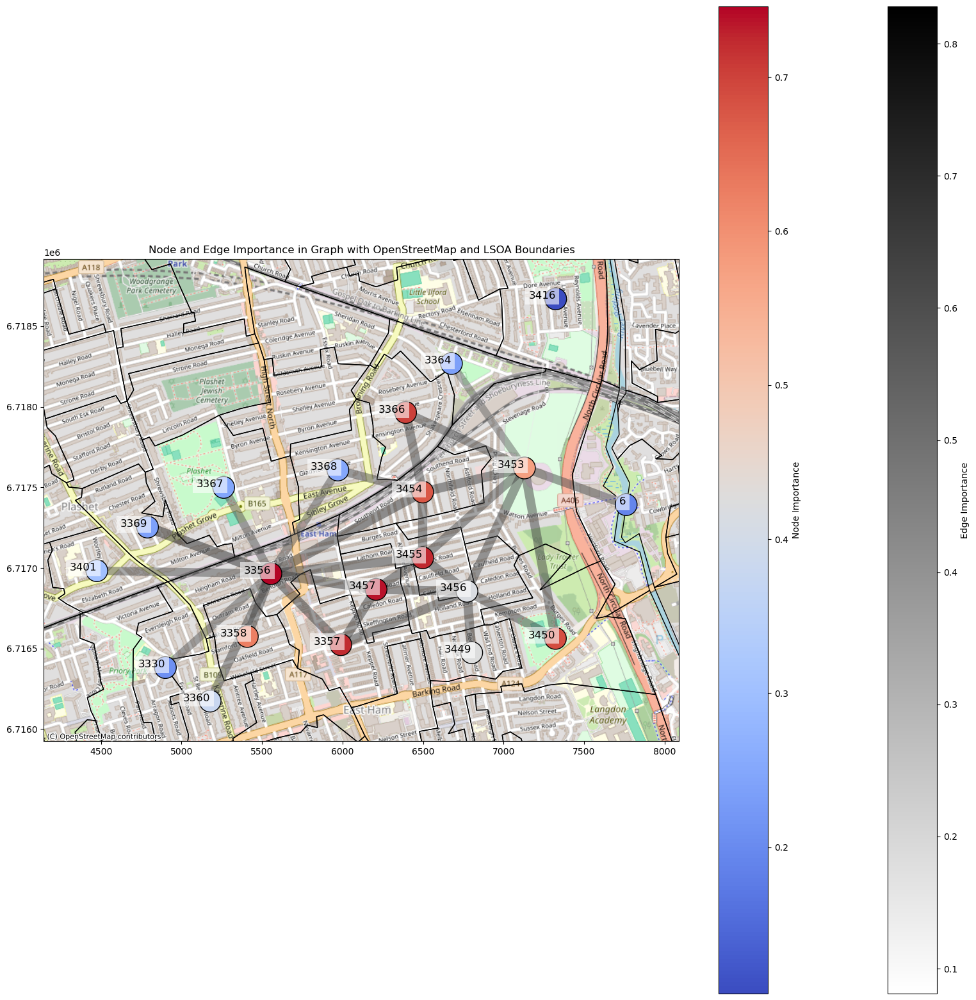

In [223]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
import geopandas as gpd
from shapely.geometry import Point
import contextily as ctx

# 读取LSOA的shapefile并转换坐标系
fp = 'LSOA_(Dec_2021)_Boundaries_Generalised_Clipped_EW_(BGC).shp'
London_lsoas_2021 = gpd.read_file(fp).rename(columns={'LSOA21CD':'geography code'})
London_lsoas_2021 = London_lsoas_2021[London_lsoas_2021["geography code"].str.startswith("E")]

# 设置原始坐标系为EPSG:27700（英国国家格网）
London_lsoas_2021.set_crs(epsg=27700, inplace=True)
# 转换为WGS84坐标系（EPSG:4326）
London_lsoas_2021 = London_lsoas_2021.to_crs(epsg=4326)
# 转换为墨卡托投影以匹配OpenStreetMap
London_lsoas_2021 = London_lsoas_2021.to_crs(epsg=3857)

# 获取解释子图中的节点
node_indices = np.where(explanation.node_mask > 0)[0]
edge_indices = np.where(explanation.edge_mask > 0)[0]

# 获取节点的位置数据
node_positions = data.pos.numpy()

# 创建无向图
G = nx.Graph()

# 获取节点的重要性值
node_mask_values = {idx: explanation.node_mask[idx].item() for idx in node_indices}

# 添加解释子图中的节点和节点的重要性值作为属性
for idx in node_indices:
    value = explanation.node_mask[idx].item()
    lat, lon = node_positions[idx]
    G.add_node(int(idx), importance=value, pos=(lon, lat))

# 合成无向边并计算边的重要性
edge_importance = {}
for i in edge_indices:
    mask_value = explanation.edge_mask[i].item()
    source, target = data.edge_index[:, i]
    if source.item() in node_indices and target.item() in node_indices:  # 仅添加解释子图中的边
        if source.item() > target.item():  # 确保无向边的一致性
            source, target = target, source
        if (source.item(), target.item()) in edge_importance:
            edge_importance[(source.item(), target.item())].append(mask_value)
        else:
            edge_importance[(source.item(), target.item())] = [mask_value]

# 输出调试信息
print("Node indices:", node_indices)
print("Edge indices:", edge_indices)
print("Node positions:", {idx: (node_positions[idx][0], node_positions[idx][1]) for idx in node_indices})
print("Edge importance:", edge_importance)

# 计算每条无向边的重要性，对于只有一条有向边的情况直接使用该重要性值
edge_importance = {
    edge: np.mean(values) if len(values) > 1 else values[0] for edge, values in edge_importance.items()
}

# 添加边和边的重要性值作为属性
for (source, target), importance in edge_importance.items():
    G.add_edge(source, target, importance=importance)

# 获取节点位置
pos = nx.get_node_attributes(G, 'pos')

# 将节点位置转换为GeoDataFrame
geometry = [Point(lon, lat) for lat, lon in pos.values()]
node_importance = [G.nodes[node]['importance'] for node in G.nodes]
gdf = gpd.GeoDataFrame(list(pos.keys()), geometry=geometry, columns=['node'])
gdf['importance'] = node_importance

# 设置原始坐标系为EPSG:27700（英国国家格网）
gdf.set_crs(epsg=27700, inplace=True)
# 转换为WGS84坐标系（EPSG:4326）
gdf = gdf.to_crs(epsg=4326)
# 转换为墨卡托投影以匹配OpenStreetMap
gdf = gdf.to_crs(epsg=3857)

# 调试信息：检查转换后的坐标和边界框值
print("Converted coordinates:\n", gdf)
bounds = gdf.total_bounds  # 获取GeoDataFrame的边界框 [minx, miny, maxx, maxy]
print("Bounds:", bounds)

# 绘制图形
fig, ax = plt.subplots(figsize=(20, 20))

# 设置地图范围
if np.isfinite(bounds).all():
    x_buffer = (bounds[2] - bounds[0]) * 0.1
    y_buffer = (bounds[3] - bounds[1]) * 0.1
    ax.set_xlim([bounds[0] - x_buffer, bounds[2] + x_buffer])
    ax.set_ylim([bounds[1] - y_buffer, bounds[3] + y_buffer])
else:
    print("Invalid bounds detected, skipping axis limits setting")

# 添加OpenStreetMap底图
ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# 绘制LSOA边界
London_lsoas_2021.boundary.plot(ax=ax, linewidth=1, edgecolor='black', zorder=2)

# 绘制GeoDataFrame并使用importance列作为颜色
gdf.plot(ax=ax, column='importance', cmap=plt.cm.coolwarm, markersize=600, edgecolor='black', zorder=5)

# 确保有边被添加到图中
if len(G.edges) > 0:
    # 绘制边，颜色和粗细根据重要性值进行调整
    for (source, target), importance in edge_importance.items():
        source_pos = gdf.loc[gdf['node'] == source, 'geometry'].values[0]
        target_pos = gdf.loc[gdf['node'] == target, 'geometry'].values[0]
        ax.plot([source_pos.x, target_pos.x], [source_pos.y, target_pos.y], 
                color=plt.cm.binary(importance), linewidth=14*importance, alpha=0.5, zorder=3)

    # 添加颜色条以显示边的重要性
    sm_edges = plt.cm.ScalarMappable(cmap=plt.cm.binary, norm=plt.Normalize(vmin=min(edge_importance.values()), vmax=max(edge_importance.values())))
    sm_edges._A = []
    plt.colorbar(sm_edges, ax=ax, label='Edge Importance')

# 添加节点的重要性颜色条
sm = plt.cm.ScalarMappable(cmap=plt.cm.coolwarm, norm=plt.Normalize(vmin=min(node_importance), vmax=max(node_importance)))
sm._A = []
plt.colorbar(sm, ax=ax, label='Node Importance')

# 添加节点标签
for node, (lat, lon) in pos.items():
    point = gpd.GeoSeries([Point(lon, lat)], crs="EPSG:27700").to_crs("EPSG:3857").geometry[0]
    ax.text(point.x, point.y, str(node), fontsize=12, ha='right', zorder=10, bbox=dict(facecolor='white', alpha=0.6, edgecolor='none'))

plt.title("Node and Edge Importance in Graph with OpenStreetMap and LSOA Boundaries")
plt.show()

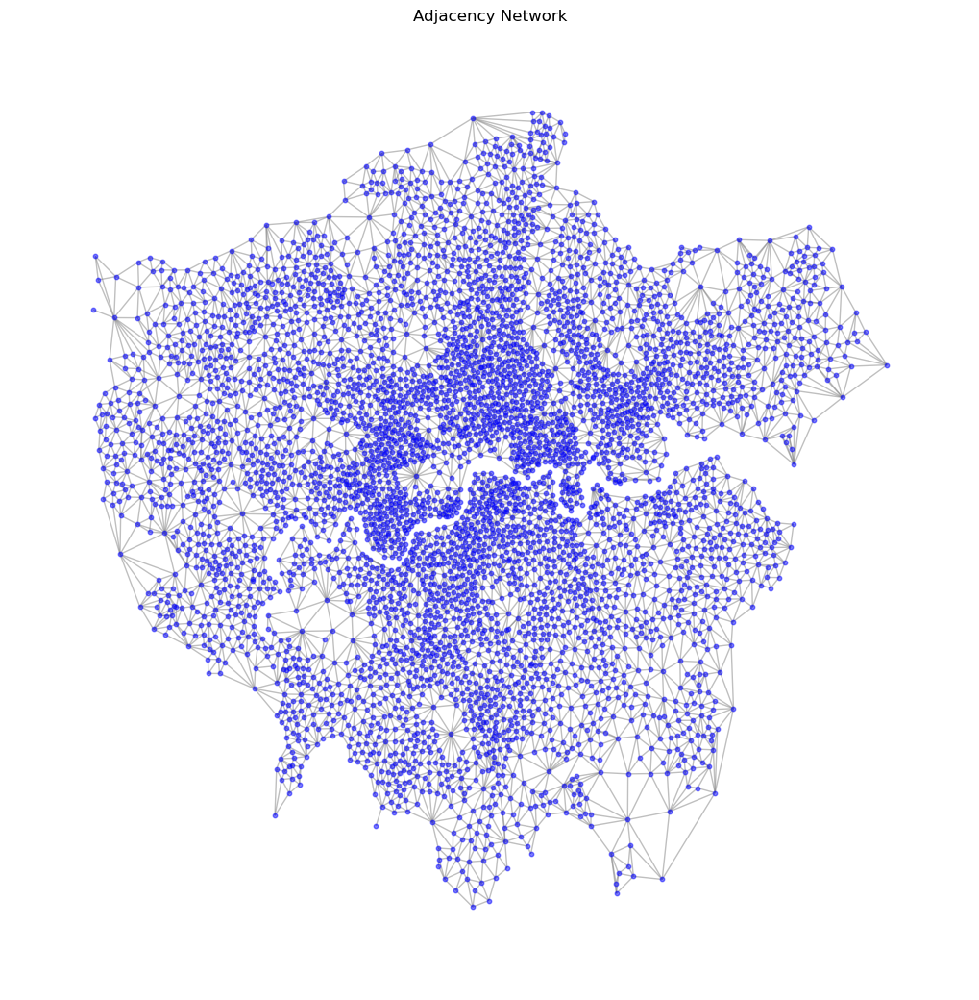

Remaining NaN count per column after filling:
 e_ndvi                                      0
e_water                                     0
e_trees                                     0
e_grass                                     0
e_bare                                      0
e_built                                     0
e_shrub_and_scrub                           0
e_crops                                     0
e_flooded_vegetation                        0
e_lake_mix_layer_depth                      0
e_snow_cover                                0
e_surface_runoff_sum                        0
e_snow_and_ice                              0
e_evaporation_from_the_top_of_canopy_sum    0
dtype: int64


In [159]:
import torch
from torch_geometric.data import Data
from torch_geometric.nn import GINConv
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
import random
import itertools
from torch.optim.lr_scheduler import ReduceLROnPlateau
import networkx as nx
import geopandas as gpd
from shapely import wkt
import pandas as pd
from torch_geometric.utils import from_networkx
import re

# 读取CSV文件并创建GeoDataFrame
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# 创建几何对象（假设geometry列包含WKT格式的多边形数据）
df['geometry'] = df['geometry'].apply(wkt.loads)
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# 设置坐标系 (假设是WGS84坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 计算每个LSOA的几何中心点
gdf['geo_centroid'] = gdf.centroid

# 计算相邻关系
neighbors = gpd.sjoin(gdf, gdf, how='left', predicate='intersects')

# 手动处理索引
neighbors = neighbors[neighbors.index != neighbors.index_right]

# 构建邻接矩阵
G = nx.Graph()

# 添加节点
for idx, row in gdf.iterrows():
    G.add_node(idx, pos=(row.geo_centroid.x, row.geo_centroid.y))

# 添加边，根据相邻关系
edges_added = set()
for idx, row in neighbors.iterrows():
    if row.name != row['index_right']:  # 避免自环
        edge = tuple(sorted((row.name, row['index_right'])))
        if edge not in edges_added:
            G.add_edge(row.name, row['index_right'], weight=1)
            edges_added.add(edge)

# 可视化邻接关系
pos = nx.get_node_attributes(G, 'pos')
plt.figure(figsize=(10, 10))
nx.draw(G, pos, node_size=10, node_color='blue', edge_color='grey', alpha=0.5)
plt.title("Adjacency Network")
plt.show()

# 提取节点特征
node_features = gdf[['e_ndvi', 'e_water', 'e_trees', 'e_grass', 'e_bare','e_built','e_shrub_and_scrub','e_crops','e_flooded_vegetation','e_lake_mix_layer_depth','e_snow_cover','e_surface_runoff_sum','e_snow_and_ice','e_evaporation_from_the_top_of_canopy_sum']].apply(pd.to_numeric, errors='coerce')

# excluded_e_columns = ['e_ozone', 'e_total_aerosol_optical_depth_at_550nm_surface', 'e_particulate_matter_d_less_than_25_um_surface']
# e_features_columns = [col for col in gdf.columns if col.startswith('e_'|'c_') and col not in excluded_e_columns]

# 排除特定列
# excluded_columns = ['e_ozone', 'e_total_aerosol_optical_depth_at_550nm_surface', 'e_particulate_matter_d_less_than_25_um_surface']
# 使用正则表达式选择以 e_ 和 c_ 开头的列，并排除特定的列
# selected_columns = [col for col in gdf.columns if (col.startswith('e_') or col.startswith('c_')) and col not in excluded_columns]


# node_features = gdf[selected_columns].apply(pd.to_numeric, errors='coerce')

# 使用邻接节点的均值填充空值
for i, row in node_features.iterrows():
    for col in node_features.columns:
        if pd.isna(row[col]):
            neighbor_indices = list(G.neighbors(i))  # 使用NetworkX图获取邻居索引
            if neighbor_indices:  # 确保有邻居
                neighbor_values = node_features.iloc[neighbor_indices][col]
                mean_value = neighbor_values.mean()
                if pd.isna(mean_value):
                    mean_value = node_features[col].mean()  # 如果邻居的均值还是nan，使用全局均值填充
                node_features.at[i, col] = mean_value
            else:
                node_features.at[i, col] = node_features[col].mean()  # 如果没有邻居，使用全局均值填充

# 再次检查是否有任何nan值
print("Remaining NaN count per column after filling:\n", node_features.isna().sum())

# 标准化节点特征
scaler = StandardScaler()
node_features_scaled = scaler.fit_transform(node_features)
node_features_tensor = torch.tensor(node_features_scaled, dtype=torch.float)

# 准备目标变量
target_column = 'o_total_quantity_per_capita'
target = gdf[target_column].apply(pd.to_numeric, errors='coerce').fillna(0)
targets = torch.tensor(target.values, dtype=torch.float)

# 计算边的属性（绝对差值）
edge_attributes = []
edges = []
for u, v in G.edges():
    edge_weight = abs(targets[u].item() - targets[v].item())
    edge_attributes.append(edge_weight)
    edges.append((u, v))

# 转换为PyTorch Geometric数据
data = from_networkx(G)
data.x = node_features_tensor
data.edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
data.edge_attr = torch.tensor(edge_attributes, dtype=torch.float).view(-1, 1)
data.y = torch.tensor(edge_attributes, dtype=torch.float).view(-1, 1)

MSE: 1.7549
RMSE: 1.3247
MAE: 0.6079
R²: 0.3767


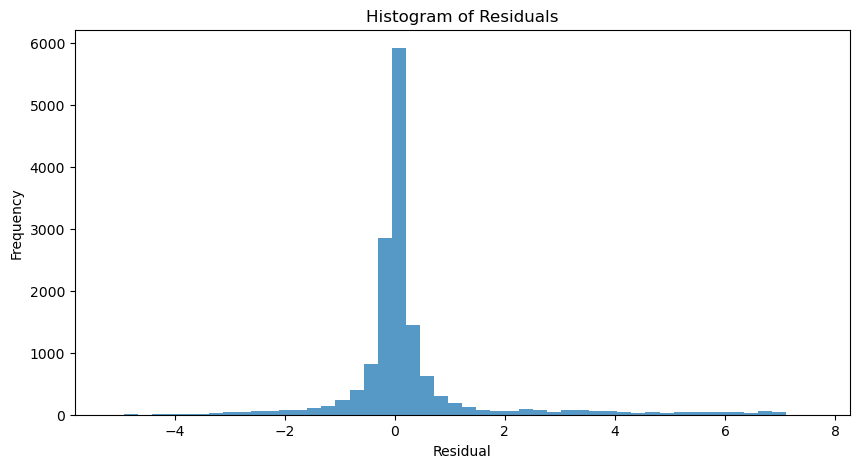

In [201]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import random
import itertools

# 定义GATv2模型
class GATv2(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.conv2(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.fc1(x)
        return x
        
def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    out = model(data.x, data.edge_index)
    edge_index = data.edge_index
    pred_edge_attr = torch.abs(out[edge_index[0]] - out[edge_index[1]])
    loss = F.mse_loss(pred_edge_attr, data.edge_attr)
    loss.backward()
    optimizer.step()
    return loss.item()
# 使用最佳超参数重新训练模型
model = GATv2(
    in_channels=data.x.shape[1], 
    hidden1=best_params['hidden1'], 
    hidden2=best_params['hidden2'], 
    out_channels=1,  # out_channels should be 1 for regression
    dropout=best_params['dropout']
)
optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])

losses = []
for epoch in range(best_params['num_epochs']):
    loss = train(model, optimizer, data)
    losses.append(loss)

# 测试模型并计算评估指标
model.eval()
with torch.no_grad():
    out = model(data.x, data.edge_index)
    edge_index = data.edge_index
    pred_edge_attr = torch.abs(out[edge_index[0]] - out[edge_index[1]])

# 计算评估指标
y_true = data.edge_attr.detach().numpy().flatten()
y_pred = pred_edge_attr.detach().numpy().flatten()

mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

print(f'MSE: {mse:.4f}')
print(f'RMSE: {rmse:.4f}')
print(f'MAE: {mae:.4f}')
print(f'R²: {r2:.4f}')

# 可视化残差
residuals = y_true - y_pred
plt.figure(figsize=(10, 5))
plt.hist(residuals, bins=50, alpha=0.75)
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.title('Histogram of Residuals')
plt.show()

from torch_geometric.explain import Explainer, GNNExplainer

# 包装模型，只返回最终的输出
class WrappedModel(torch.nn.Module):
    def __init__(self, model):
        super(WrappedModel, self).__init__()
        self.model = model

    def forward(self, x, edge_index):
        return self.model(x, edge_index)

In [202]:
wrapped_model = WrappedModel(model)
wrapped_model

WrappedModel(
  (model): GATv2(
    (conv1): GATv2Conv(14, 128, heads=1)
    (conv2): GATv2Conv(128, 64, heads=1)
    (fc1): Linear(in_features=64, out_features=1, bias=True)
  )
)

In [211]:
# 查找边 (912, 4979) 在 edge_index 中的位置
def find_edge_index(edge_index, source, target):
    for i in range(edge_index.shape[1]):
        if edge_index[0, i] == source and edge_index[1, i] == target:
            return i
    return None

edge_idx = find_edge_index(data.edge_index, 912, 4979)
if edge_idx is None:
    raise ValueError("Edge (912, 4979) not found in edge_index")

# 应用解释器解释连接预测模型
for explanation_type in ['phenomenon']:
    explainer = Explainer(
        model=wrapped_model,
        algorithm=GNNExplainer(epochs=200),
        explanation_type=explanation_type,
        node_mask_type='attributes',
        edge_mask_type='object',
        model_config=dict(
            mode='regression',
            task_level='edge',
            return_type='raw',
        ),
        # threshold_config=dict(threshold_type='hard', value=0.5) 
    )

# 选择一个边进行解释（例如，边0-4536）
explanation = explainer(data.x, data.edge_index, index=edge_idx, target=data.edge_attr[edge_idx])

# 输出解释结果
print(f'Generated explanations in {explanation.available_explanations}')

# 可视化特征重要性
# path = 'feature_importance.png'
# explanation.visualize_feature_importance(path, top_k=10)
# print(f"Feature importance plot has been saved to '{path}'")

# 可视化子图
# path = 'subgraph.pdf'
# explanation.visualize_graph(path)
# print(f"Subgraph visualization plot has been saved to '{path}'")

# 获取子图节点索引
edge_mask = explanation.edge_mask > 0  # 使用掩码阈值
edge_index = data.edge_index[:, edge_mask]
node_indices = edge_index.unique().tolist()

A = explanation.get_explanation_subgraph()
A

IndexError: index 3033 is out of bounds for dimension 0 with size 1

In [208]:
A.edge_mask

tensor([0.0757, 0.0758, 0.0754, 0.0754, 0.0758, 0.1380, 0.0758, 0.0757, 0.0897,
        0.0760, 0.1149, 0.3202])

In [212]:
data

Data(edge_index=[2, 14736], pos=[4994, 2], weight=[29472], x=[4994, 14], edge_attr=[14736, 1], y=[14736, 1])

In [197]:
explanation.edge_mask

tensor([0., 0., 0.,  ..., 0., 0., 0.])

In [196]:
explanation.node_mask

tensor([[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]])

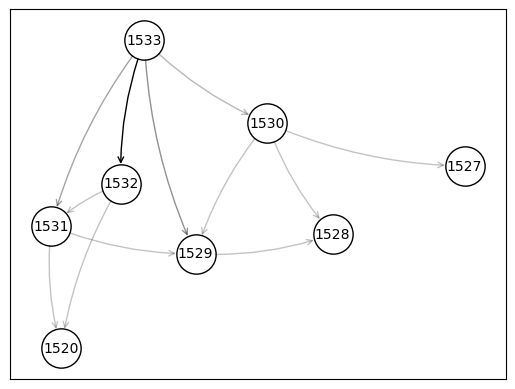

In [206]:
explanation.visualize_graph()

In [207]:
# 获取每个节点对应的 node_mask 值
node_mask_values = [explanation.node_mask[idx].item() for idx in node_indices]

# 打印所有索引和对应的 node_mask 值
for idx, mask_value in zip(node_indices, node_mask_values):
    print(f"Node: {idx}, value: {mask_value}")

RuntimeError: a Tensor with 14 elements cannot be converted to Scalar

MSE: 1.7125
RMSE: 1.3086
MAE: 0.6225
R²: 0.3918


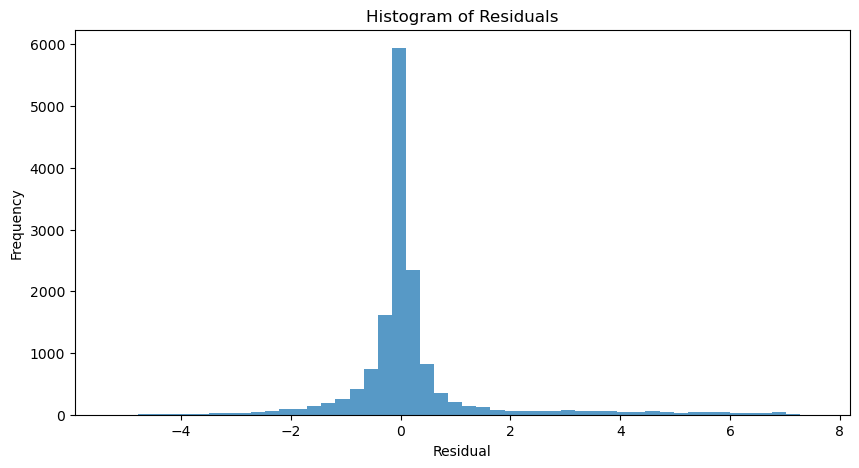

TypeError: WrappedModel.forward() takes 2 positional arguments but 3 were given

In [81]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import random
import itertools
from torch_geometric.explain import Explainer, GNNExplainer

# 定义GATv2模型
class GATv2(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.bn1 = torch.nn.BatchNorm1d(hidden1)  # Batch normalization
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.bn2 = torch.nn.BatchNorm1d(hidden2)  # Batch normalization
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = self.bn1(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.conv2(x, edge_index)
        x = self.bn2(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.fc1(x)
        return x

# 包装模型，只返回最终的输出
class WrappedModel(torch.nn.Module):
    def __init__(self, model):
        super(WrappedModel, self).__init__()
        self.model = model

    def forward(self, data):
        return self.model(data)

def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    out = model(data)
    edge_index = data.edge_index
    pred_edge_attr = torch.abs(out[edge_index[0]] - out[edge_index[1]])
    loss = F.mse_loss(pred_edge_attr, data.edge_attr)
    loss.backward()
    optimizer.step()
    return loss.item()

# 使用最佳超参数重新训练模型
model = GATv2(
    in_channels=data.x.shape[1], 
    hidden1=best_params['hidden1'], 
    hidden2=best_params['hidden2'], 
    out_channels=1,  # out_channels should be 1 for regression
    dropout=best_params['dropout']
)
wrapped_model = WrappedModel(model)
optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])

losses = []
for epoch in range(best_params['num_epochs']):
    loss = train(model, optimizer, data)
    losses.append(loss)

# 测试模型并计算评估指标
model.eval()
with torch.no_grad():
    out = model(data)
    edge_index = data.edge_index
    pred_edge_attr = torch.abs(out[edge_index[0]] - out[edge_index[1]])

# 计算评估指标
y_true = data.edge_attr.detach().numpy().flatten()
y_pred = pred_edge_attr.detach().numpy().flatten()

mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

print(f'MSE: {mse:.4f}')
print(f'RMSE: {rmse:.4f}')
print(f'MAE: {mae:.4f}')
print(f'R²: {r2:.4f}')

# 可视化残差
residuals = y_true - y_pred
plt.figure(figsize=(10, 5))
plt.hist(residuals, bins=50, alpha=0.75)
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.title('Histogram of Residuals')
plt.show()

# 应用解释器解释连接预测模型
for explanation_type in ['phenomenon']:
    explainer = Explainer(
        model=wrapped_model,
        algorithm=GNNExplainer(epochs=200),
        explanation_type=explanation_type,
        node_mask_type='object',
        edge_mask_type='object',
        model_config=dict(
            mode='regression',
            task_level='edge',
            return_type='raw',
        ),
        # threshold_config=dict(threshold_type='hard', value=0.5) 
    )

# 选择一个节点进行解释（例如，节点0）
node_idx = 408
explanation = explainer(data.x, data.edge_index, target=data.y, index=node_idx)

# 输出解释结果
print(f'Generated explanations in {explanation.available_explanations}')

# 可视化特征重要性
# path = 'feature_importance.png'
# explanation.visualize_feature_importance(path, top_k=10)
# print(f"Feature importance plot has been saved to '{path}'")

# 可视化子图
# path = 'subgraph.pdf'
# explanation.visualize_graph(path)
# print(f"Subgraph visualization plot has been saved to '{path}'")

# 获取子图节点索引
edge_mask = explanation.edge_mask > 0  # 使用掩码阈值
edge_index = data.edge_index[:, edge_mask]
node_indices = edge_index.unique().tolist()


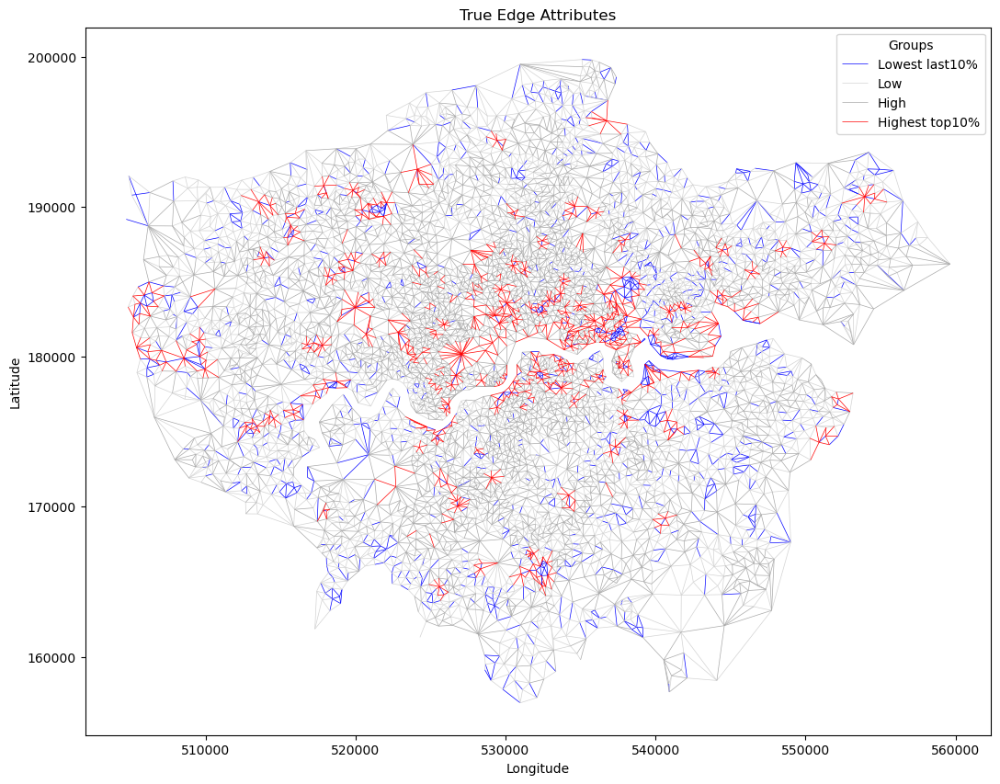

In [33]:
import matplotlib.pyplot as plt
import geopandas as gpd
import networkx as nx
from shapely.geometry import LineString
import numpy as np
import pandas as pd

# 获取边的坐标
edge_lines = []
for u, v in G.edges():
    u_pos = G.nodes[u]['pos']
    v_pos = G.nodes[v]['pos']
    line = LineString([u_pos, v_pos])
    edge_lines.append(line)

# 创建 GeoDataFrame 保存边的几何信息
edge_gdf = gpd.GeoDataFrame(geometry=edge_lines)

# 将真实值添加到 GeoDataFrame 中
edge_gdf['true'] = y_true

# 将真实值分为四组
quantiles = np.quantile(edge_gdf['true'], [0, 0.1, 0.5, 0.90, 1.0])
colors = ['blue', 'lightgray', 'darkgray', 'red']
edge_gdf['color'] = pd.cut(edge_gdf['true'], bins=quantiles, labels=colors, include_lowest=True)

# 绘制地图
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# 根据颜色分组绘制边
for color in colors:
    edge_gdf[edge_gdf['color'] == color].plot(ax=ax, color=color, linewidth=0.5, label=f'{color} group')

# 添加图例
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:4], ['Lowest last10%', 'Low', 'High', 'Highest top10%'], title='Groups')

ax.set_aspect('equal')  # 确保长宽比相等
plt.title("True Edge Attributes")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


       avg_edge_value
count     4994.000000
mean         0.714859
std          1.147878
min          0.000000
25%          0.093652
50%          0.225880
75%          0.749363
max          7.129500


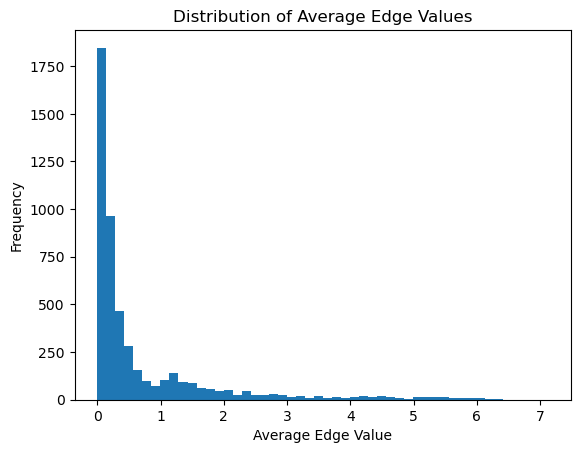

Quantiles: [0.         0.04590591 0.22587986 2.04644924 7.12949955]


{'high_value_nodes': [4744,
  4794,
  1559,
  1978,
  4973,
  4979,
  4753,
  960,
  4681,
  2400,
  4768,
  4037,
  3126,
  1976,
  4747,
  4276,
  4907,
  4729,
  3749,
  3782],
 'low_value_nodes': [3100,
  3455,
  660,
  978,
  4745,
  4787,
  3159,
  408,
  2367,
  1287,
  3381,
  1620,
  1452,
  975,
  3103,
  2120,
  3964,
  2853,
  1533,
  1543],
 'medium_value_nodes': [1526,
  4186,
  1964,
  1665,
  4268,
  1617,
  1889,
  928,
  4466,
  2298,
  3698,
  3789,
  4547,
  2872,
  923,
  2695,
  3176,
  3047,
  3516,
  2175]}

In [34]:
import networkx as nx
import numpy as np
import pandas as pd

# 假设 G 是已经构建好的图，edge_gdf 包含边的属性

# 创建字典从 edge_gdf 中获取每条边的 'true' 值
edge_true_values = {}
for idx, row in edge_gdf.iterrows():
    edge_true_values[(row.geometry.coords[0], row.geometry.coords[1])] = row['true']
    edge_true_values[(row.geometry.coords[1], row.geometry.coords[0])] = row['true']

# 将 'true' 值附加到图的边属性中
for u, v, data in G.edges(data=True):
    if (G.nodes[u]['pos'], G.nodes[v]['pos']) in edge_true_values:
        data['true'] = edge_true_values[(G.nodes[u]['pos'], G.nodes[v]['pos'])]
    elif (G.nodes[v]['pos'], G.nodes[u]['pos']) in edge_true_values:
        data['true'] = edge_true_values[(G.nodes[v]['pos'], G.nodes[u]['pos'])]

# 计算每个节点的平均边值
node_avg_edge_values = {}
for node in G.nodes:
    edge_values = []
    for neighbor in G.neighbors(node):
        edge_data = G.get_edge_data(node, neighbor)
        if 'true' in edge_data:
            edge_values.append(edge_data['true'])
    node_avg_edge_values[node] = np.mean(edge_values) if edge_values else 0

# 将节点分为高值、低值和普通
node_df = pd.DataFrame.from_dict(node_avg_edge_values, orient='index', columns=['avg_edge_value'])

# 打印平均边值的分布情况
print(node_df.describe())

# 绘制平均边值的直方图
plt.hist(node_df['avg_edge_value'], bins=50)
plt.title('Distribution of Average Edge Values')
plt.xlabel('Average Edge Value')
plt.ylabel('Frequency')
plt.show()

# 计算分位点并检查是否有重复的分位点
quantiles = np.quantile(node_df['avg_edge_value'], [0, 0.1, 0.5, 0.9, 1.0])
unique_quantiles = np.unique(quantiles)
print("Quantiles:", quantiles)

# 如果分位点过少，则直接使用值分类
if len(unique_quantiles) < 4:
    low_threshold = np.percentile(node_df['avg_edge_value'], 10)
    high_threshold = np.percentile(node_df['avg_edge_value'], 90)
    
    def categorize(value):
        if value <= low_threshold:
            return 'low'
        elif value >= high_threshold:
            return 'high'
        else:
            return 'medium'
    
    node_df['category'] = node_df['avg_edge_value'].apply(categorize)
else:
    node_df['category'] = pd.cut(node_df['avg_edge_value'], bins=quantiles, labels=['low', 'medium_low', 'medium', 'high'], include_lowest=True)

# 检查每个类别中的节点数量并进行抽样
def sample_nodes(df, category, n):
    nodes = df[df['category'] == category]
    if len(nodes) < n:
        return nodes.index.tolist()
    return nodes.sample(n=n, random_state=1).index.tolist()

high_value_nodes = sample_nodes(node_df, 'high', 20)
low_value_nodes = sample_nodes(node_df, 'low', 20)
medium_value_nodes = sample_nodes(node_df, 'medium', 20)

selected_nodes = {
    'high_value_nodes': high_value_nodes,
    'low_value_nodes': low_value_nodes,
    'medium_value_nodes': medium_value_nodes
}

selected_nodes


C:\Users\0\AppData\Local\Temp\ipykernel_26036\4213776044.py:32: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['geo_centroid'] = gdf.centroid


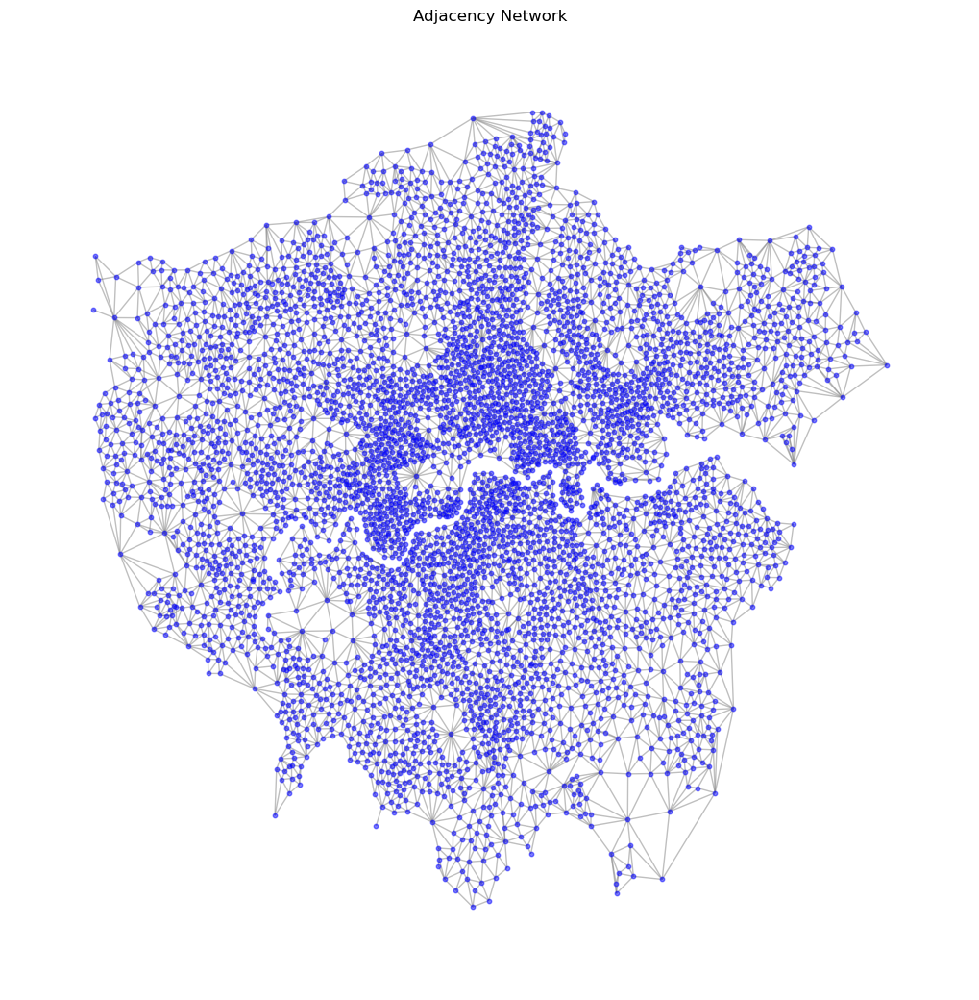

Remaining NaN count per column after filling:
 e_ndvi                                      0
e_water                                     0
e_trees                                     0
e_grass                                     0
e_bare                                      0
e_built                                     0
e_shrub_and_scrub                           0
e_crops                                     0
e_flooded_vegetation                        0
e_lake_mix_layer_depth                      0
e_snow_cover                                0
e_surface_runoff_sum                        0
e_snow_and_ice                              0
e_evaporation_from_the_top_of_canopy_sum    0
dtype: int64


In [35]:
import torch
from torch_geometric.data import Data
from torch_geometric.nn import GINConv
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
import random
import itertools
from torch.optim.lr_scheduler import ReduceLROnPlateau
import networkx as nx
import geopandas as gpd
from shapely import wkt
import pandas as pd
from torch_geometric.utils import from_networkx
import re

# 读取CSV文件并创建GeoDataFrame
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# 创建几何对象（假设geometry列包含WKT格式的多边形数据）
df['geometry'] = df['geometry'].apply(wkt.loads)
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# 设置坐标系 (假设是WGS84坐标系)
gdf.set_crs(epsg=4326, inplace=True)

# 计算每个LSOA的几何中心点
gdf['geo_centroid'] = gdf.centroid

# 计算相邻关系
neighbors = gpd.sjoin(gdf, gdf, how='left', predicate='intersects')

# 手动处理索引
neighbors = neighbors[neighbors.index != neighbors.index_right]

# 构建邻接矩阵
G = nx.Graph()

# 添加节点
for idx, row in gdf.iterrows():
    G.add_node(idx, pos=(row.geo_centroid.x, row.geo_centroid.y))

# 添加边，根据相邻关系
edges_added = set()
for idx, row in neighbors.iterrows():
    if row.name != row['index_right']:  # 避免自环
        edge = tuple(sorted((row.name, row['index_right'])))
        if edge not in edges_added:
            G.add_edge(row.name, row['index_right'], weight=1)
            edges_added.add(edge)

# 可视化邻接关系
pos = nx.get_node_attributes(G, 'pos')
plt.figure(figsize=(10, 10))
nx.draw(G, pos, node_size=10, node_color='blue', edge_color='grey', alpha=0.5)
plt.title("Adjacency Network")
plt.show()

# 提取节点特征
node_features = gdf[['e_ndvi', 'e_water', 'e_trees', 'e_grass', 'e_bare','e_built','e_shrub_and_scrub','e_crops','e_flooded_vegetation','e_lake_mix_layer_depth','e_snow_cover','e_surface_runoff_sum','e_snow_and_ice','e_evaporation_from_the_top_of_canopy_sum']].apply(pd.to_numeric, errors='coerce')

# excluded_e_columns = ['e_ozone', 'e_total_aerosol_optical_depth_at_550nm_surface', 'e_particulate_matter_d_less_than_25_um_surface']
# e_features_columns = [col for col in gdf.columns if col.startswith('e_'|'c_') and col not in excluded_e_columns]

# 排除特定列
# excluded_columns = ['e_ozone', 'e_total_aerosol_optical_depth_at_550nm_surface', 'e_particulate_matter_d_less_than_25_um_surface']
# 使用正则表达式选择以 e_ 和 c_ 开头的列，并排除特定的列
# selected_columns = [col for col in gdf.columns if (col.startswith('e_') or col.startswith('c_')) and col not in excluded_columns]


# node_features = gdf[selected_columns].apply(pd.to_numeric, errors='coerce')

# 使用邻接节点的均值填充空值
for i, row in node_features.iterrows():
    for col in node_features.columns:
        if pd.isna(row[col]):
            neighbor_indices = list(G.neighbors(i))  # 使用NetworkX图获取邻居索引
            if neighbor_indices:  # 确保有邻居
                neighbor_values = node_features.iloc[neighbor_indices][col]
                mean_value = neighbor_values.mean()
                if pd.isna(mean_value):
                    mean_value = node_features[col].mean()  # 如果邻居的均值还是nan，使用全局均值填充
                node_features.at[i, col] = mean_value
            else:
                node_features.at[i, col] = node_features[col].mean()  # 如果没有邻居，使用全局均值填充

# 再次检查是否有任何nan值
print("Remaining NaN count per column after filling:\n", node_features.isna().sum())

# 标准化节点特征
scaler = StandardScaler()
node_features_scaled = scaler.fit_transform(node_features)
node_features_tensor = torch.tensor(node_features_scaled, dtype=torch.float)

# 准备目标变量
target_column = 'o_total_quantity_per_capita'
target = gdf[target_column].apply(pd.to_numeric, errors='coerce').fillna(0)
targets = torch.tensor(target.values, dtype=torch.float)

# 计算边的属性（绝对差值）
edge_attributes = []
edges = []
for u, v in G.edges():
    edge_weight = abs(targets[u].item() - targets[v].item())
    edge_attributes.append(edge_weight)
    edges.append((u, v))

# 转换为PyTorch Geometric数据
data = from_networkx(G)
data.x = node_features_tensor
data.edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
data.edge_attr = torch.tensor(edge_attributes, dtype=torch.float).view(-1, 1)
data.y = torch.tensor(edge_attributes, dtype=torch.float).view(-1, 1)

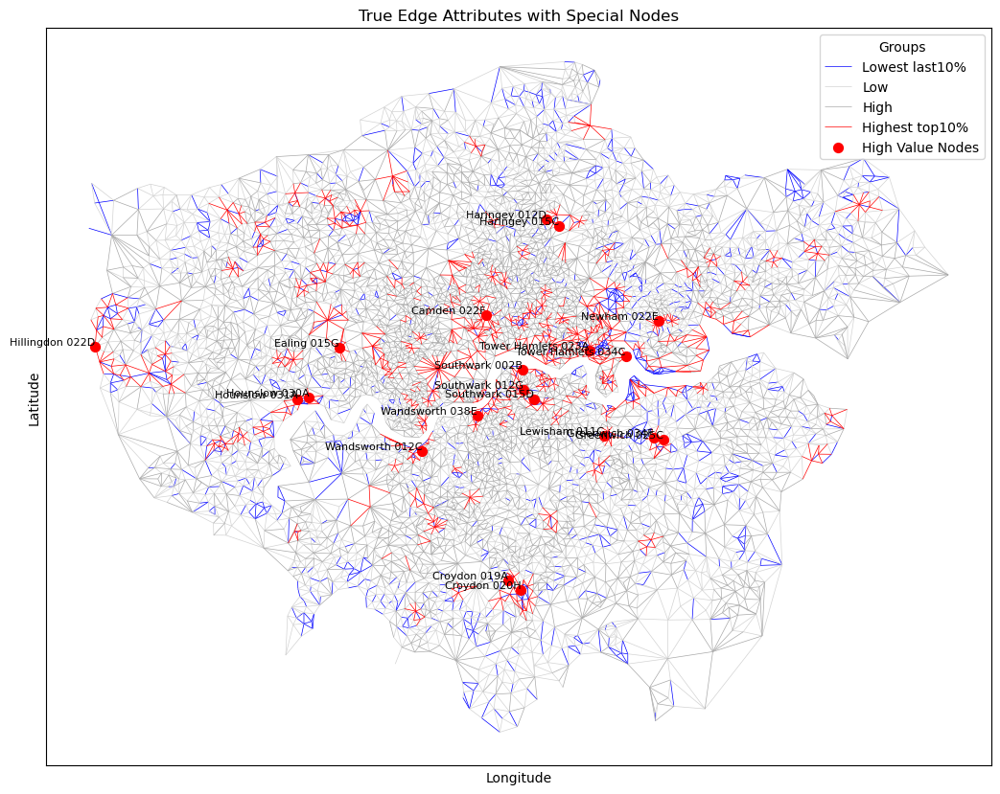

High Value Nodes Names:
{4744: 'Hounslow 030A', 4794: 'Newham 022E', 1559: 'Greenwich 025C', 1978: 'Haringey 012D', 4973: 'Tower Hamlets 034C', 4979: 'Camden 022F', 4753: 'Croydon 020H', 960: 'Croydon 019A', 4681: 'Southwark 012G', 2400: 'Hillingdon 022D', 4768: 'Greenwich 034F', 4037: 'Tower Hamlets 023A', 3126: 'Lewisham 011C', 1976: 'Haringey 015C', 4747: 'Hounslow 031A', 4276: 'Wandsworth 012C', 4907: 'Wandsworth 038E', 4729: 'Ealing 015G', 3749: 'Southwark 002B', 3782: 'Southwark 015D'}
Low Value Nodes Names:
{3100: 'Lewisham 002D', 3455: 'Newham 015C', 660: 'Bromley 002C', 978: 'Croydon 043B', 4745: 'Hounslow 030B', 4787: 'Greenwich 041A', 3159: 'Lewisham 024D', 408: 'Bexley 026A', 2367: 'Hillingdon 004E', 1287: 'Ealing 005A', 3381: 'Newham 006A', 1620: 'Greenwich 015A', 1452: 'Enfield 016D', 975: 'Croydon 044D', 3103: 'Lewisham 021B', 2120: 'Harrow 003C', 3964: 'Sutton 005C', 2853: 'Kingston upon Thames 016D', 1533: 'Greenwich 014D', 1543: 'Greenwich 027A'}
Medium Value Nodes Na

In [36]:
import matplotlib.pyplot as plt
import geopandas as gpd
import networkx as nx
from shapely.geometry import LineString
import numpy as np
import pandas as pd
import torch
from torch_geometric.data import Data

# 假设 high_value_nodes, low_value_nodes, medium_value_nodes 已经定义
high_value_nodes
low_value_nodes
medium_value_nodes

# 获取节点名称
node_names = {idx: row['LSOA21NM'] for idx, row in gdf.iterrows()}

# 获取特殊节点的名称
high_value_node_names = {node: node_names[node] for node in high_value_nodes}
low_value_node_names = {node: node_names[node] for node in low_value_nodes}
medium_value_node_names = {node: node_names[node] for node in medium_value_nodes}

# 获取边的坐标
edge_lines = []
for u, v in G.edges():
    u_pos = G.nodes[u]['pos']
    v_pos = G.nodes[v]['pos']
    line = LineString([u_pos, v_pos])
    edge_lines.append(line)

# 创建 GeoDataFrame 保存边的几何信息
edge_gdf = gpd.GeoDataFrame(geometry=edge_lines)

# 确保 data 对象存在且具有 y 属性
if isinstance(data, Data) and hasattr(data, 'y'):
    edge_gdf['true'] = data.y.numpy()
else:
    raise AttributeError("data object is not a PyTorch Geometric Data object with attribute 'y'.")

# 将真实值分为四组
quantiles = np.quantile(edge_gdf['true'], [0, 0.1, 0.5, 0.90, 1.0])
colors = ['blue', 'lightgray', 'darkgray', 'red']
edge_gdf['color'] = pd.cut(edge_gdf['true'], bins=quantiles, labels=colors, include_lowest=True)

# 从data中获取节点位置
pos = {i: (data.pos[i][0].item(), data.pos[i][1].item()) for i in range(data.pos.shape[0])}

# 创建绘图
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# 根据颜色分组绘制边
for color in colors:
    edge_gdf[edge_gdf['color'] == color].plot(ax=ax, color=color, linewidth=0.5, label=f'{color} group')

# 绘制节点位置
high_nodes_pos = {node: pos[node] for node in high_value_nodes}
# low_nodes_pos = {node: pos[node] for node in low_value_nodes}
# medium_nodes_pos = {node: pos[node] for node in medium_value_nodes}

nx.draw_networkx_nodes(G, pos, nodelist=high_value_nodes, node_size=50, node_color='red', label='High Value Nodes', ax=ax)
# nx.draw_networkx_nodes(G, pos, nodelist=low_value_nodes, node_size=50, node_color='blue', label='Low Value Nodes', ax=ax)
# nx.draw_networkx_nodes(G, pos, nodelist=medium_value_nodes, node_size=50, node_color='green', label='Medium Value Nodes', ax=ax)

# 添加节点名称
# nx.draw_networkx_labels(G, pos, labels=high_value_node_names, font_size=8, font_color='red', ax=ax)
# nx.draw_networkx_labels(G, pos, labels=low_value_node_names, font_size=8, font_color='blue', ax=ax)
# nx.draw_networkx_labels(G, pos, labels=medium_value_node_names, font_size=8, font_color='green', ax=ax)
# 添加节点名称，偏移标签位置
for node, (x, y) in pos.items():
    if node in high_value_node_names:
        ax.text(x, y, high_value_node_names[node], fontsize=8, color='black', ha='right', va='bottom')
    # if node in low_value_node_names:
    #     ax.text(x, y, low_value_node_names[node], fontsize=8, color='blue', ha='right', va='bottom')
    # if node in medium_value_node_names:
    #     ax.text(x, y, medium_value_node_names[node], fontsize=8, color='green', ha='right', va='bottom')

# 添加图例项
high_node_legend = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='High Value Nodes')
ax.legend(handles=ax.get_legend_handles_labels()[0] + [high_node_legend],
          labels=['Lowest last10%', 'Low', 'High', 'Highest top10%', 'High Value Nodes'], title='Groups')

ax.set_aspect('equal')  # 确保长宽比相等
plt.title("True Edge Attributes with Special Nodes")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# 打印特殊节点的名称
print("High Value Nodes Names:")
print(high_value_node_names)
print("Low Value Nodes Names:")
print(low_value_node_names)
print("Medium Value Nodes Names:")
print(medium_value_node_names)


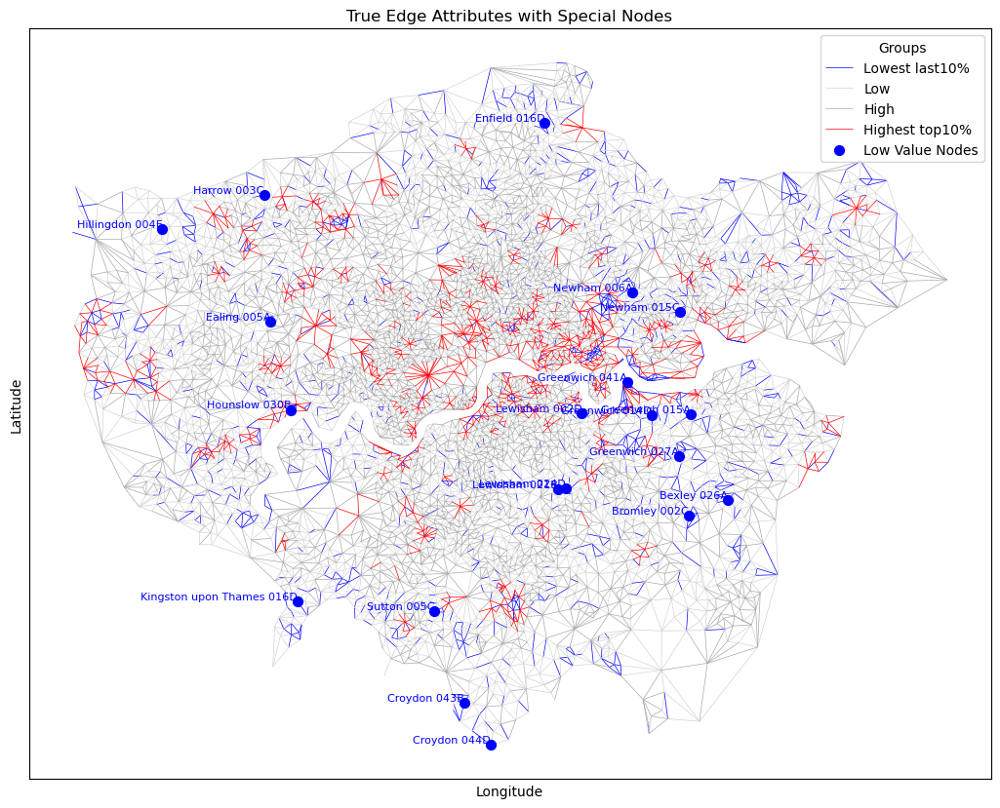

High Value Nodes Names:
{4744: 'Hounslow 030A', 4794: 'Newham 022E', 1559: 'Greenwich 025C', 1978: 'Haringey 012D', 4973: 'Tower Hamlets 034C', 4979: 'Camden 022F', 4753: 'Croydon 020H', 960: 'Croydon 019A', 4681: 'Southwark 012G', 2400: 'Hillingdon 022D', 4768: 'Greenwich 034F', 4037: 'Tower Hamlets 023A', 3126: 'Lewisham 011C', 1976: 'Haringey 015C', 4747: 'Hounslow 031A', 4276: 'Wandsworth 012C', 4907: 'Wandsworth 038E', 4729: 'Ealing 015G', 3749: 'Southwark 002B', 3782: 'Southwark 015D'}
Low Value Nodes Names:
{3100: 'Lewisham 002D', 3455: 'Newham 015C', 660: 'Bromley 002C', 978: 'Croydon 043B', 4745: 'Hounslow 030B', 4787: 'Greenwich 041A', 3159: 'Lewisham 024D', 408: 'Bexley 026A', 2367: 'Hillingdon 004E', 1287: 'Ealing 005A', 3381: 'Newham 006A', 1620: 'Greenwich 015A', 1452: 'Enfield 016D', 975: 'Croydon 044D', 3103: 'Lewisham 021B', 2120: 'Harrow 003C', 3964: 'Sutton 005C', 2853: 'Kingston upon Thames 016D', 1533: 'Greenwich 014D', 1543: 'Greenwich 027A'}
Medium Value Nodes Na

In [37]:
import matplotlib.pyplot as plt
import geopandas as gpd
import networkx as nx
from shapely.geometry import LineString
import numpy as np
import pandas as pd
import torch
from torch_geometric.data import Data

# 假设 high_value_nodes, low_value_nodes, medium_value_nodes 已经定义
high_value_nodes
low_value_nodes
medium_value_nodes

# 获取节点名称
node_names = {idx: row['LSOA21NM'] for idx, row in gdf.iterrows()}

# 获取特殊节点的名称
high_value_node_names = {node: node_names[node] for node in high_value_nodes}
low_value_node_names = {node: node_names[node] for node in low_value_nodes}
medium_value_node_names = {node: node_names[node] for node in medium_value_nodes}

# 获取边的坐标
edge_lines = []
for u, v in G.edges():
    u_pos = G.nodes[u]['pos']
    v_pos = G.nodes[v]['pos']
    line = LineString([u_pos, v_pos])
    edge_lines.append(line)

# 创建 GeoDataFrame 保存边的几何信息
edge_gdf = gpd.GeoDataFrame(geometry=edge_lines)

# 确保 data 对象存在且具有 y 属性
if isinstance(data, Data) and hasattr(data, 'y'):
    edge_gdf['true'] = data.y.numpy()
else:
    raise AttributeError("data object is not a PyTorch Geometric Data object with attribute 'y'.")

# 将真实值分为四组
quantiles = np.quantile(edge_gdf['true'], [0, 0.1, 0.5, 0.90, 1.0])
colors = ['blue', 'lightgray', 'darkgray', 'red']
edge_gdf['color'] = pd.cut(edge_gdf['true'], bins=quantiles, labels=colors, include_lowest=True)

# 从data中获取节点位置
pos = {i: (data.pos[i][0].item(), data.pos[i][1].item()) for i in range(data.pos.shape[0])}

# 创建绘图
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# 根据颜色分组绘制边
for color in colors:
    edge_gdf[edge_gdf['color'] == color].plot(ax=ax, color=color, linewidth=0.5, label=f'{color} group')

# 绘制节点位置
# high_nodes_pos = {node: pos[node] for node in high_value_nodes}
low_nodes_pos = {node: pos[node] for node in low_value_nodes}
# medium_nodes_pos = {node: pos[node] for node in medium_value_nodes}

# nx.draw_networkx_nodes(G, pos, nodelist=high_value_nodes, node_size=50, node_color='red', label='High Value Nodes', ax=ax)
nx.draw_networkx_nodes(G, pos, nodelist=low_value_nodes, node_size=50, node_color='blue', label='Low Value Nodes', ax=ax)
# nx.draw_networkx_nodes(G, pos, nodelist=medium_value_nodes, node_size=50, node_color='green', label='Medium Value Nodes', ax=ax)

# 添加节点名称
# nx.draw_networkx_labels(G, pos, labels=high_value_node_names, font_size=8, font_color='red', ax=ax)
# nx.draw_networkx_labels(G, pos, labels=low_value_node_names, font_size=8, font_color='blue', ax=ax)
# nx.draw_networkx_labels(G, pos, labels=medium_value_node_names, font_size=8, font_color='green', ax=ax)
# 添加节点名称，偏移标签位置
for node, (x, y) in pos.items():
    # if node in high_value_node_names:
    #     ax.text(x, y, high_value_node_names[node], fontsize=8, color='black', ha='right', va='bottom')
    if node in low_value_node_names:
        ax.text(x, y, low_value_node_names[node], fontsize=8, color='blue', ha='right', va='bottom')
    # if node in medium_value_node_names:
    #     ax.text(x, y, medium_value_node_names[node], fontsize=8, color='green', ha='right', va='bottom')

# 添加图例项
high_node_legend = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Low Value Nodes')
ax.legend(handles=ax.get_legend_handles_labels()[0] + [high_node_legend],
          labels=['Lowest last10%', 'Low', 'High', 'Highest top10%', 'Low Value Nodes'], title='Groups')

ax.set_aspect('equal')  # 确保长宽比相等
plt.title("True Edge Attributes with Special Nodes")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# 打印特殊节点的名称
print("High Value Nodes Names:")
print(high_value_node_names)
print("Low Value Nodes Names:")
print(low_value_node_names)
print("Medium Value Nodes Names:")
print(medium_value_node_names)


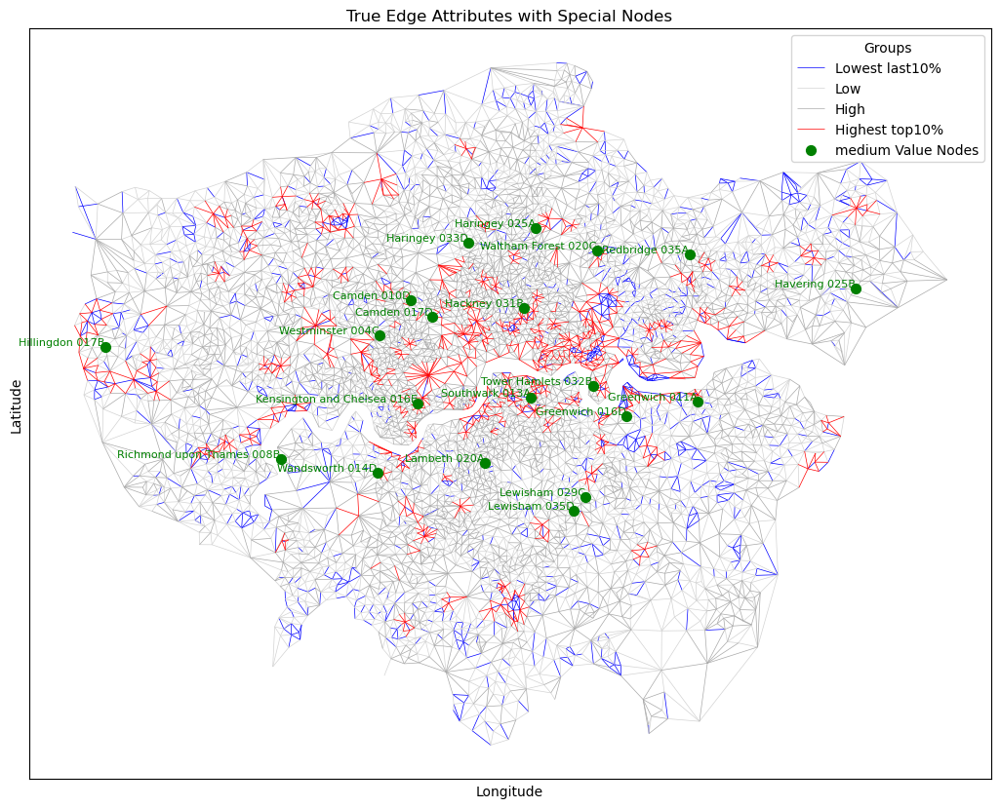

High Value Nodes Names:
{4744: 'Hounslow 030A', 4794: 'Newham 022E', 1559: 'Greenwich 025C', 1978: 'Haringey 012D', 4973: 'Tower Hamlets 034C', 4979: 'Camden 022F', 4753: 'Croydon 020H', 960: 'Croydon 019A', 4681: 'Southwark 012G', 2400: 'Hillingdon 022D', 4768: 'Greenwich 034F', 4037: 'Tower Hamlets 023A', 3126: 'Lewisham 011C', 1976: 'Haringey 015C', 4747: 'Hounslow 031A', 4276: 'Wandsworth 012C', 4907: 'Wandsworth 038E', 4729: 'Ealing 015G', 3749: 'Southwark 002B', 3782: 'Southwark 015D'}
Low Value Nodes Names:
{3100: 'Lewisham 002D', 3455: 'Newham 015C', 660: 'Bromley 002C', 978: 'Croydon 043B', 4745: 'Hounslow 030B', 4787: 'Greenwich 041A', 3159: 'Lewisham 024D', 408: 'Bexley 026A', 2367: 'Hillingdon 004E', 1287: 'Ealing 005A', 3381: 'Newham 006A', 1620: 'Greenwich 015A', 1452: 'Enfield 016D', 975: 'Croydon 044D', 3103: 'Lewisham 021B', 2120: 'Harrow 003C', 3964: 'Sutton 005C', 2853: 'Kingston upon Thames 016D', 1533: 'Greenwich 014D', 1543: 'Greenwich 027A'}
Medium Value Nodes Na

In [38]:
import matplotlib.pyplot as plt
import geopandas as gpd
import networkx as nx
from shapely.geometry import LineString
import numpy as np
import pandas as pd
import torch
from torch_geometric.data import Data

# 假设 high_value_nodes, low_value_nodes, medium_value_nodes 已经定义
high_value_nodes
low_value_nodes
medium_value_nodes

# 获取节点名称
node_names = {idx: row['LSOA21NM'] for idx, row in gdf.iterrows()}

# 获取特殊节点的名称
high_value_node_names = {node: node_names[node] for node in high_value_nodes}
low_value_node_names = {node: node_names[node] for node in low_value_nodes}
medium_value_node_names = {node: node_names[node] for node in medium_value_nodes}

# 获取边的坐标
edge_lines = []
for u, v in G.edges():
    u_pos = G.nodes[u]['pos']
    v_pos = G.nodes[v]['pos']
    line = LineString([u_pos, v_pos])
    edge_lines.append(line)

# 创建 GeoDataFrame 保存边的几何信息
edge_gdf = gpd.GeoDataFrame(geometry=edge_lines)

# 确保 data 对象存在且具有 y 属性
if isinstance(data, Data) and hasattr(data, 'y'):
    edge_gdf['true'] = data.y.numpy()
else:
    raise AttributeError("data object is not a PyTorch Geometric Data object with attribute 'y'.")

# 将真实值分为四组
quantiles = np.quantile(edge_gdf['true'], [0, 0.1, 0.5, 0.90, 1.0])
colors = ['blue', 'lightgray', 'darkgray', 'red']
edge_gdf['color'] = pd.cut(edge_gdf['true'], bins=quantiles, labels=colors, include_lowest=True)

# 从data中获取节点位置
pos = {i: (data.pos[i][0].item(), data.pos[i][1].item()) for i in range(data.pos.shape[0])}

# 创建绘图
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# 根据颜色分组绘制边
for color in colors:
    edge_gdf[edge_gdf['color'] == color].plot(ax=ax, color=color, linewidth=0.5, label=f'{color} group')

# 绘制节点位置
# high_nodes_pos = {node: pos[node] for node in high_value_nodes}
# low_nodes_pos = {node: pos[node] for node in low_value_nodes}
medium_nodes_pos = {node: pos[node] for node in medium_value_nodes}

# nx.draw_networkx_nodes(G, pos, nodelist=high_value_nodes, node_size=50, node_color='red', label='High Value Nodes', ax=ax)
# nx.draw_networkx_nodes(G, pos, nodelist=low_value_nodes, node_size=50, node_color='blue', label='Low Value Nodes', ax=ax)
nx.draw_networkx_nodes(G, pos, nodelist=medium_value_nodes, node_size=50, node_color='green', label='Medium Value Nodes', ax=ax)

# 添加节点名称
# nx.draw_networkx_labels(G, pos, labels=high_value_node_names, font_size=8, font_color='red', ax=ax)
# nx.draw_networkx_labels(G, pos, labels=low_value_node_names, font_size=8, font_color='blue', ax=ax)
# nx.draw_networkx_labels(G, pos, labels=medium_value_node_names, font_size=8, font_color='green', ax=ax)
# 添加节点名称，偏移标签位置
for node, (x, y) in pos.items():
    # if node in high_value_node_names:
    #     ax.text(x, y, high_value_node_names[node], fontsize=8, color='black', ha='right', va='bottom')
    # if node in low_value_node_names:
    #     ax.text(x, y, low_value_node_names[node], fontsize=8, color='blue', ha='right', va='bottom')
    if node in medium_value_node_names:
        ax.text(x, y, medium_value_node_names[node], fontsize=8, color='green', ha='right', va='bottom')

# 添加图例项
high_node_legend = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='medium Value Nodes')
ax.legend(handles=ax.get_legend_handles_labels()[0] + [high_node_legend],
          labels=['Lowest last10%', 'Low', 'High', 'Highest top10%', 'medium Value Nodes'], title='Groups')

ax.set_aspect('equal')  # 确保长宽比相等
plt.title("True Edge Attributes with Special Nodes")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# 打印特殊节点的名称
print("High Value Nodes Names:")
print(high_value_node_names)
print("Low Value Nodes Names:")
print(low_value_node_names)
print("Medium Value Nodes Names:")
print(medium_value_node_names)